In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
import random
import os.path
from datetime import date
from numpy import vstack
from numpy import hstack
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import tensorflow as tf
from tensorflow.python.keras.models import Sequential, model_from_json
from tensorflow.python.keras.optimizers import adam_v2
from tensorflow.python.keras.optimizers import gradient_descent_v2
from tensorflow.python.keras.layers import Dense
import pandas as pd
import csv
import seaborn as sns


2023-05-19 10:28:06.822452: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-19 10:28:07.433042: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
#     MartchStart = 735658
#     JunEnd = 735780
#     for indexDay in range (MartchStart,JunEnd):
#         print(date.fromordinal(indexDay))

In [3]:
def returnFileNamesList():
    dateList = []
    returnNameList = []
    startDay = 735599
    MartchStart = 735658
    JunEnd = 735780
    endDay = 735964
    for indexDay in range (startDay,endDay):
        dateList.append(f'POES_m01_e2_tel90_dB1000_'+date.fromordinal(indexDay).strftime("20%y%m%d")+'.csv')
    path = '/home/yinbo/Desktop/Physics_ML/codes/ML/'
    for fileName in dateList:
        checkedPath = path+fileName
        print(checkedPath)
        if os.path.isfile(checkedPath):
            returnNameList.append(checkedPath)     
        else:
            continue
    # df.to_csv('merged_POES_m01_e2_tel90_dB1000_20150101_20150110.csv',index=False)
    return returnNameList

returnNameList =returnFileNamesList()

/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150101.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150102.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150103.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150104.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150105.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150106.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150107.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150108.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150109.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150110.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150111.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150112.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000

In [4]:
def inputData(fileName):
    flag = 0
    training_file =fileName
    df_train = pd.read_csv(training_file,header = None)
    df_train.dropna(inplace = True)
    dataset_train = df_train.values
    #remove 0 on column 1
    dataset_train = dataset_train[dataset_train[:,0]!=0]
    X = dataset_train[:,1:963]
    Y = np.log10(dataset_train[:,0])
    if X.size ==0:
        flag = 1
        X_train = None
        X_test = None
        Y_train = None
        Y_test = None
    else:
        X_train, X_test, Y_train, Y_test = train_test_split(X,Y, train_size = 0.8)
        
    return X_train, X_test, Y_train, Y_test, flag
    

In [5]:
def defineModel():
    #define neural network model, use tensorflow cuda Gpu
    model = Sequential()
    model.add(Dense(100,kernel_initializer = 'he_normal', activation = 'relu',input_dim=962))
    model.add(Dense(50,kernel_initializer = 'he_normal', activation = 'relu'))
    model.add(Dense(1))
    #compile the model and specify loss and optimizer
    #opt = adam_v2.Adam(learning_rate = 0.01, beta_1= 0.85, beta_2= 0.999)
    opt = adam_v2.Adam(learning_rate = 0.0001)
    #opt = gradient_descent_v2.SGD(learning_rate=0.00001, momentum=0.9)
    model.compile(optimizer = opt, loss='mse',metrics=['mse','mae'])
   
    return model
    

In [6]:
def feedModel(inputX,inputYLable,model):
     #fit the model on the training dataset
    history= model.fit(inputX,inputYLable,verbose = 1,shuffle=True, epochs = 200, batch_size = 100)
    return model,history
    

In [7]:
def evaluateMode(xTrain,yTrain,model):
    # evaluate the model
    scores = model.evaluate(xTrain,yTrain, verbose=0)
    print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

In [8]:
def saveModel(model):
    # serialize model to JSON
    model_json = model.to_json()
    with open("model.json", "w") as json_file:
        json_file.write(model_json)
    # serialize weights to HDF5
    model.save_weights("model_both.h5")

In [16]:
def loadModel():
    # load json and create model
    json_file = open('model_both.json', 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)
    # load weights into new model
    loaded_model.load_weights("model_both.h5")
    print("Loaded model from disk")

In [10]:
def combineData():
    #execution starts from here!!!!
    returnNameList =returnFileNamesList()
    oldXTrain = []
    oldYTrain = []
    count = 0
    for fileName in returnNameList:
        print(fileName)
        xTrain, xTest, yTrain, yTest, flag = inputData(fileName)
        if flag == 1:
            pass
        else:
            # create a composite dataset of old and new data
            #This part will use lots of memory....
            if count > 0:
                X_both, Y_both = vstack((oldXTrain, xTrain)), hstack((oldYTrain, yTrain))
                oldXTrain = X_both
                oldYTrain = Y_both
            elif count == 0:
                oldXTrain = xTrain
                oldYTrain = yTrain
            
        count+=1
            
    return X_both,Y_both
    

In [11]:
#execution starts from here!!!!
# returnNameList =returnFileNamesList()
X_both,Y_both = combineData()
print(X_both.shape)

/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150101.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150102.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150103.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150104.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150105.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150106.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150107.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150108.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150109.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150110.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150111.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150112.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000

/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150102.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150103.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150104.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150105.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150106.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150107.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150108.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150109.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150110.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150111.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150112.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150113.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000

/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150418.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150419.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150420.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150421.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150422.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150423.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150424.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150425.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150426.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150427.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150428.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150429.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000

/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150810.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150811.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150812.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150813.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150814.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150815.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150816.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150817.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150818.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150819.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150820.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150821.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000

/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151124.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151125.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151126.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151127.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151128.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151129.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151130.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151201.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151202.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151203.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151204.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20151205.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000

In [12]:
#execution starts from here!!!!
# returnNameList =returnFileNamesList()
model= defineModel()
print(X_both.shape)
# count = 0
model,history = feedModel(X_both,Y_both,model)
saveModel(model)

2023-05-19 10:30:10.340656: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-19 10:30:10.365670: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-19 10:30:10.365973: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

(330007, 962)


2023-05-19 10:30:11.342443: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1269866936 exceeds 10% of free system memory.
2023-05-19 10:30:12.169923: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1269866936 exceeds 10% of free system memory.


Epoch 1/200
3301/3301 [==============================] - 6s 2ms/step - loss: 1027.8612 - mse: 1027.8612 - mae: 16.2216
Epoch 2/200
3301/3301 [==============================] - 5s 2ms/step - loss: 27.7537 - mse: 27.7537 - mae: 3.8194
Epoch 3/200
3301/3301 [==============================] - 5s 2ms/step - loss: 6.9676 - mse: 6.9676 - mae: 1.9534
Epoch 4/200
3301/3301 [==============================] - 5s 2ms/step - loss: 3.7183 - mse: 3.7183 - mae: 1.4590
Epoch 5/200
3301/3301 [==============================] - 5s 2ms/step - loss: 2.5158 - mse: 2.5158 - mae: 1.2019
Epoch 6/200
3301/3301 [==============================] - 5s 2ms/step - loss: 2.0778 - mse: 2.0778 - mae: 1.0914
Epoch 7/200
3301/3301 [==============================] - 5s 2ms/step - loss: 1.8460 - mse: 1.8460 - mae: 1.0224
Epoch 8/200
3301/3301 [==============================] - 5s 2ms/step - loss: 1.4659 - mse: 1.4659 - mae: 0.9156
Epoch 9/200
3301/3301 [==============================] - 5s 2ms/step - loss: 1.2566 - mse: 1.25

3301/3301 [==============================] - 5s 2ms/step - loss: 0.2081 - mse: 0.2081 - mae: 0.3254
Epoch 74/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.2078 - mse: 0.2078 - mae: 0.3255
Epoch 75/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.2052 - mse: 0.2052 - mae: 0.3226
Epoch 76/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.2050 - mse: 0.2050 - mae: 0.3224
Epoch 77/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.2035 - mse: 0.2035 - mae: 0.3211
Epoch 78/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.2029 - mse: 0.2029 - mae: 0.3207
Epoch 79/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.2016 - mse: 0.2016 - mae: 0.3197
Epoch 80/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.2012 - mse: 0.2012 - mae: 0.3191
Epoch 81/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.1997 - mse: 0.1997 - mae: 0.3

3301/3301 [==============================] - 5s 2ms/step - loss: 0.1773 - mse: 0.1773 - mae: 0.3007
Epoch 146/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.1764 - mse: 0.1764 - mae: 0.3005
Epoch 147/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.1771 - mse: 0.1771 - mae: 0.3011
Epoch 148/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.1739 - mse: 0.1739 - mae: 0.2984
Epoch 149/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.1791 - mse: 0.1791 - mae: 0.3027
Epoch 150/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.1751 - mse: 0.1751 - mae: 0.2995
Epoch 151/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.1773 - mse: 0.1773 - mae: 0.3009
Epoch 152/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.1746 - mse: 0.1746 - mae: 0.2991
Epoch 153/200
3301/3301 [==============================] - 5s 2ms/step - loss: 0.1782 - mse: 0.1782 - 

In [13]:
#execution starts from here!!!!
# returnNameList =returnFileNamesList()
# model = defineModel()
# count = 0
# oldXTrain = []
# oldYTrain = []

# for fileName in returnNameList:
#     print(fileName)
#     xTrain, xTest, yTrain, yTest= inputData(fileName)
#     # create a composite dataset of old and new data
#     #This part will use lots of memory....
#     if count > 0:
#         X_both, Y_both = vstack((oldXTrain, xTrain)), hstack((oldYTrain, yTrain))
#         model = feedModel(X_both,Y_both,model)
#         #evaluateMode(xTrain,yTrain,model)
#         oldXTrain = X_both
#         oldYTrain = Y_both
#     elif count == 0:
#         model = feedModel(xTrain,yTrain,model)
#         oldXTrain = xTrain
#         oldYTrain = yTrain
#     count+=1

#     if count%10:
#         saveModel(model)



Text(0.5, 0, 'epoch')

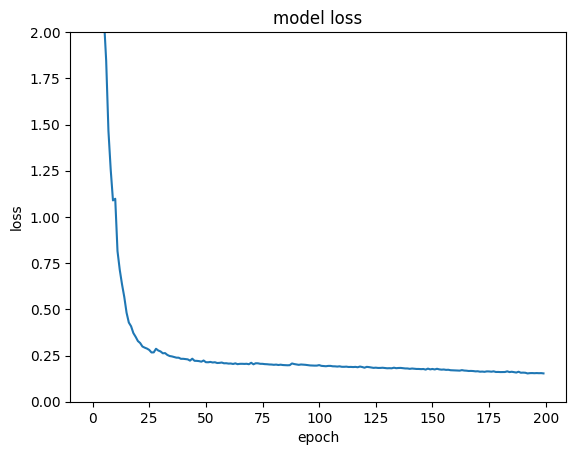

In [14]:
# summarize history for loss
plt.plot(history.history['mse'])
plt.ylim([0,2])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')

In [15]:
print(history.history.keys())

dict_keys(['loss', 'mse', 'mae'])


In [17]:
# # make a prediction
# ynew = model.predict(X_both)
# # show the inputs and predicted outputs


# for i in range(len(X_both)):
#  print("X=%s, Predicted=%s" % (Y_both[i], ynew[i]))

2023-05-19 11:58:49.893713: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1269866936 exceeds 10% of free system memory.
2023-05-19 11:58:50.714546: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1269866936 exceeds 10% of free system memory.


X=5.215928229339918, Predicted=[5.1500645]
X=5.191789040104612, Predicted=[5.0386543]
X=5.2387960566796705, Predicted=[5.2148147]
X=5.376107738622583, Predicted=[5.0268936]
X=5.281206141151663, Predicted=[5.0776415]
X=5.399805201101162, Predicted=[5.2840815]
X=5.260519768326274, Predicted=[4.8356004]
X=5.281206141151663, Predicted=[5.230199]
X=4.2880188229024565, Predicted=[5.0139923]
X=5.467310582260394, Predicted=[5.4269066]
X=5.300953987478738, Predicted=[5.1520333]
X=4.1947834378245705, Predicted=[5.051051]
X=4.937677839395737, Predicted=[5.016505]
X=4.841420167315108, Predicted=[5.081848]
X=5.443643122159503, Predicted=[5.4234366]
X=5.376107738622583, Predicted=[5.0276246]
X=4.589437971354037, Predicted=[4.866394]
X=3.986211715514367, Predicted=[4.87602]
X=4.820046373556808, Predicted=[5.0125556]
X=5.166228758210086, Predicted=[4.847379]
X=5.260519768326274, Predicted=[5.2097487]
X=4.717566492827677, Predicted=[4.8633084]
X=5.281206141151663, Predicted=[5.141169]
X=4.3973367891999

X=4.589437971354037, Predicted=[5.045581]
X=5.036844392458506, Predicted=[4.497035]
X=4.717566492827677, Predicted=[3.703944]
X=4.41624763429714, Predicted=[3.873092]
X=4.262417863745012, Predicted=[4.534798]
X=5.075013802376317, Predicted=[4.899164]
X=4.563859444957633, Predicted=[5.038501]
X=3.6836224124763164, Predicted=[3.659723]
X=4.1710357127322615, Predicted=[4.876927]
X=4.496295724262449, Predicted=[4.8991523]
X=3.045757056265976, Predicted=[2.8294313]
X=4.496295724262449, Predicted=[4.923006]
X=4.434369274298713, Predicted=[4.474748]
X=5.075013802376317, Predicted=[4.9524508]
X=4.959405855814053, Predicted=[4.909458]
X=4.055156539892158, Predicted=[5.0067368]
X=4.999849273662248, Predicted=[4.9043016]
X=4.540173000466751, Predicted=[4.926283]
X=4.335094666608594, Predicted=[4.623389]
X=4.658209885911894, Predicted=[4.9534955]
X=2.318758067752686, Predicted=[2.1600764]
X=4.1947834378245705, Predicted=[5.0138073]
X=5.260519768326274, Predicted=[4.9368663]
X=4.518787590773438, Pr

X=4.717566492827677, Predicted=[4.5931616]
X=4.890661854098843, Predicted=[5.265028]
X=5.166228758210086, Predicted=[5.3983564]
X=5.337944202209029, Predicted=[5.203388]
X=5.376107738622583, Predicted=[5.2197323]
X=5.793921630713476, Predicted=[5.8564167]
X=5.300953987478738, Predicted=[5.488189]
X=5.677169701047847, Predicted=[5.843816]
X=5.300953987478738, Predicted=[4.8995667]
X=5.5822770468854035, Predicted=[5.43723]
X=5.075013802376317, Predicted=[5.1901007]
X=5.53986865295931, Predicted=[5.239729]
X=5.166228758210086, Predicted=[5.041283]
X=5.517003128747692, Predicted=[5.6039543]
X=5.620909181277951, Predicted=[5.835801]
X=5.300953987478738, Predicted=[5.1658287]
X=5.376107738622583, Predicted=[5.0456886]
X=5.561590286207738, Predicted=[5.6461034]
X=5.517003128747692, Predicted=[5.2241654]
X=5.121192031773474, Predicted=[5.039318]
X=5.215928229339918, Predicted=[5.4012775]
X=5.399805201101162, Predicted=[5.0529976]
X=2.841637229956193, Predicted=[4.8011293]
X=4.841420167315108, 

X=4.959405855814053, Predicted=[4.7384224]
X=5.467310582260394, Predicted=[5.2979875]
X=1.841637229956193, Predicted=[4.7796435]
X=5.300953987478738, Predicted=[5.410225]
X=5.2387960566796705, Predicted=[5.215539]
X=5.215928229339918, Predicted=[5.325111]
X=5.2387960566796705, Predicted=[5.322323]
X=5.215928229339918, Predicted=[5.404238]
X=4.7356763313331465, Predicted=[5.1477966]
X=4.937677839395737, Predicted=[4.7128]
X=5.399805201101162, Predicted=[5.4327745]
X=5.036844392458506, Predicted=[5.075447]
X=5.300953987478738, Predicted=[5.3779345]
X=4.820046373556808, Predicted=[5.151921]
X=5.2387960566796705, Predicted=[5.4092]
X=5.215928229339918, Predicted=[4.8483467]
X=3.1638558099644336, Predicted=[4.7912736]
X=5.399805201101162, Predicted=[5.358985]
X=5.561590286207738, Predicted=[5.3677063]
X=4.820046373556808, Predicted=[4.810501]
X=4.914805770169852, Predicted=[5.185913]
X=5.121192031773474, Predicted=[4.946038]
X=5.121192031773474, Predicted=[5.195496]
X=5.561590286207738, Pre

X=5.260519768326274, Predicted=[4.7702293]
X=5.166228758210086, Predicted=[5.0359]
X=4.841420167315108, Predicted=[4.817157]
X=2.6867354486516857, Predicted=[3.7312267]
X=5.191789040104612, Predicted=[5.0265427]
X=4.797565972436864, Predicted=[4.5430484]
X=5.4222778761641806, Predicted=[5.450468]
X=5.281206141151663, Predicted=[5.2992935]
X=4.540173000466751, Predicted=[4.9645185]
X=5.281206141151663, Predicted=[4.853858]
X=4.999849273662248, Predicted=[4.903536]
X=4.472573626968941, Predicted=[4.6559324]
X=5.2387960566796705, Predicted=[4.884036]
X=5.191789040104612, Predicted=[4.8943367]
X=4.914805770169852, Predicted=[4.8341637]
X=4.312194287668486, Predicted=[4.890809]
X=4.496295724262449, Predicted=[4.9264755]
X=4.865095679715055, Predicted=[4.9977436]
X=5.191789040104612, Predicted=[4.408299]
X=5.036844392458506, Predicted=[5.4891095]
X=5.166228758210086, Predicted=[5.2905593]
X=4.959405855814053, Predicted=[4.8639135]
X=3.7527949461241605, Predicted=[4.5984144]
X=1.8416372299561

X=4.356849660929337, Predicted=[4.8980064]
X=5.018742095762382, Predicted=[4.7281713]
X=5.399805201101162, Predicted=[4.87741]
X=5.121192031773474, Predicted=[4.819628]
X=5.054226076708954, Predicted=[4.900692]
X=4.980097951077281, Predicted=[4.804628]
X=4.589437971354037, Predicted=[4.603548]
X=5.121192031773474, Predicted=[4.8412724]
X=5.0987163905275095, Predicted=[4.830784]
X=4.959405855814053, Predicted=[4.8305535]
X=5.075013802376317, Predicted=[4.805979]
X=5.0987163905275095, Predicted=[4.812115]
X=4.959405855814053, Predicted=[4.7665157]
X=4.999849273662248, Predicted=[4.7373466]
X=3.986211715514367, Predicted=[4.8123026]
X=4.434369274298713, Predicted=[4.8367224]
X=4.959405855814053, Predicted=[4.7159348]
X=4.472573626968941, Predicted=[4.82603]
X=4.937677839395737, Predicted=[4.7052326]
X=4.773857359333874, Predicted=[4.7767615]
X=4.797565972436864, Predicted=[4.563649]
X=4.959405855814053, Predicted=[4.6991553]
X=4.773857359333874, Predicted=[4.560075]
X=4.820046373556808, P

X=4.937677839395737, Predicted=[3.3117583]
X=4.773857359333874, Predicted=[5.194135]
X=4.999849273662248, Predicted=[5.367243]
X=4.773857359333874, Predicted=[5.178667]
X=4.999849273662248, Predicted=[5.3774786]
X=5.2387960566796705, Predicted=[5.458207]
X=4.980097951077281, Predicted=[5.3568954]
X=5.054226076708954, Predicted=[3.1134431]
X=4.636473854272437, Predicted=[5.001764]
X=4.980097951077281, Predicted=[5.4115734]
X=5.5822770468854035, Predicted=[3.4531085]
X=5.467310582260394, Predicted=[4.6137695]
X=5.260519768326274, Predicted=[5.4478607]
X=4.238708336369549, Predicted=[4.5513225]
X=4.2880188229024565, Predicted=[5.1838737]
X=5.492866505902553, Predicted=[5.20382]
X=5.166228758210086, Predicted=[5.2105036]
X=2.142667851004178, Predicted=[4.770561]
X=5.723335793498525, Predicted=[5.1593647]
X=4.959405855814053, Predicted=[5.1769247]
X=5.300953987478738, Predicted=[5.0841203]
X=5.2387960566796705, Predicted=[5.0792193]
X=5.260519768326274, Predicted=[3.353956]
X=6.045745330144

X=5.319842797347332, Predicted=[5.1464014]
X=5.355321231397767, Predicted=[5.1935186]
X=4.61359237434479, Predicted=[5.130298]
X=4.753061132448945, Predicted=[5.0506124]
X=4.434369274298713, Predicted=[4.897854]
X=5.492866505902553, Predicted=[5.4487877]
X=4.37756485617428, Predicted=[5.1376963]
X=4.773857359333874, Predicted=[4.773963]
X=5.121192031773474, Predicted=[5.167238]
X=5.399805201101162, Predicted=[5.0818377]
X=5.281206141151663, Predicted=[5.2141614]
X=4.496295724262449, Predicted=[4.589365]
X=4.797565972436864, Predicted=[5.110053]
X=5.517003128747692, Predicted=[5.4592233]
X=5.517003128747692, Predicted=[5.454936]
X=5.53986865295931, Predicted=[5.457384]
X=4.6789106146955435, Predicted=[4.749669]
X=5.191789040104612, Predicted=[5.1227703]
X=4.999849273662248, Predicted=[4.8579173]
X=5.036844392458506, Predicted=[5.1309595]
X=5.054226076708954, Predicted=[5.135502]
X=5.443643122159503, Predicted=[5.151833]
X=5.036844392458506, Predicted=[4.9886413]
X=4.397336789199931, Pre

X=5.337944202209029, Predicted=[4.972226]
X=4.150200555623702, Predicted=[4.8756156]
X=4.1327846250693145, Predicted=[4.876253]
X=5.300953987478738, Predicted=[4.9761586]
X=5.4222778761641806, Predicted=[4.9886184]
X=5.337944202209029, Predicted=[5.054011]
X=4.1146376681731915, Predicted=[4.8696566]
X=5.121192031773474, Predicted=[4.769404]
X=4.61359237434479, Predicted=[4.8880057]
X=5.399805201101162, Predicted=[5.263929]
X=5.355321231397767, Predicted=[4.98093]
X=5.2387960566796705, Predicted=[4.83624]
X=5.281206141151663, Predicted=[4.820268]
X=4.37756485617428, Predicted=[4.883729]
X=5.319842797347332, Predicted=[5.1756682]
X=4.999849273662248, Predicted=[4.8698125]
X=5.075013802376317, Predicted=[5.1458583]
X=5.215928229339918, Predicted=[4.972607]
X=5.0987163905275095, Predicted=[5.109694]
X=5.300953987478738, Predicted=[5.0575123]
X=4.312194287668486, Predicted=[4.8828444]
X=4.717566492827677, Predicted=[4.0822625]
X=5.142558395090279, Predicted=[4.9106207]
X=5.260519768326274, 

X=4.820046373556808, Predicted=[4.4901505]
X=4.959405855814053, Predicted=[4.517332]
X=4.890661854098843, Predicted=[4.399361]
X=5.260519768326274, Predicted=[4.7653747]
X=4.540173000466751, Predicted=[4.4449964]
X=3.960563049362819, Predicted=[4.646241]
X=4.1947834378245705, Predicted=[4.4826455]
X=4.658209885911894, Predicted=[3.8655841]
X=4.841420167315108, Predicted=[4.6531963]
X=5.054226076708954, Predicted=[5.0314193]
X=3.8689869199411047, Predicted=[4.6013036]
X=5.036844392458506, Predicted=[4.4363937]
X=4.6986684993312355, Predicted=[4.8576593]
X=4.7356763313331465, Predicted=[4.972092]
X=4.773857359333874, Predicted=[4.617753]
X=4.150200555623702, Predicted=[4.5834856]
X=3.9153560341675897, Predicted=[4.591091]
X=4.563859444957633, Predicted=[4.560537]
X=4.753061132448945, Predicted=[4.2697544]
X=4.865095679715055, Predicted=[4.610879]
X=4.797565972436864, Predicted=[4.612898]
X=4.890661854098843, Predicted=[4.8235135]
X=4.753061132448945, Predicted=[4.8287945]
X=5.21592822933

X=4.033367454404887, Predicted=[4.5114875]
X=5.142558395090279, Predicted=[4.5292473]
X=4.1327846250693145, Predicted=[4.5467596]
X=4.717566492827677, Predicted=[4.494781]
X=4.753061132448945, Predicted=[4.4478617]
X=4.312194287668486, Predicted=[4.3751526]
X=4.312194287668486, Predicted=[4.5063205]
X=4.589437971354037, Predicted=[4.3430586]
X=4.518787590773438, Predicted=[4.235314]
X=4.797565972436864, Predicted=[4.478533]
X=4.45176495046018, Predicted=[4.3618355]
X=4.518787590773438, Predicted=[4.4855046]
X=4.753061132448945, Predicted=[4.5315423]
X=5.443643122159503, Predicted=[5.161559]
X=4.753061132448945, Predicted=[4.4623294]
X=4.434369274298713, Predicted=[4.4200897]
X=4.1146376681731915, Predicted=[4.751329]
X=4.0759008219373944, Predicted=[4.4798255]
X=3.3040357454143887, Predicted=[4.5730047]
X=3.8481034816937627, Predicted=[4.446906]
X=4.41624763429714, Predicted=[4.6327662]
X=4.2880188229024565, Predicted=[4.45786]
X=4.1327846250693145, Predicted=[4.4045744]
X=4.4343692742

X=5.075013802376317, Predicted=[4.3603935]
X=3.9153560341675897, Predicted=[4.424705]
X=3.449092531119419, Predicted=[3.2832186]
X=3.8927900303521317, Predicted=[4.3957763]
X=3.7309388517677275, Predicted=[4.4536133]
X=4.095702735048115, Predicted=[4.346529]
X=5.121192031773474, Predicted=[4.674782]
X=4.312194287668486, Predicted=[3.3221636]
X=4.6986684993312355, Predicted=[4.5430517]
X=5.018742095762382, Predicted=[4.584656]
X=4.61359237434479, Predicted=[4.7567034]
X=3.773603622632923, Predicted=[4.4400525]
X=4.563859444957633, Predicted=[4.649053]
X=4.1146376681731915, Predicted=[4.0460114]
X=3.8481034816937627, Predicted=[4.451207]
X=4.937677839395737, Predicted=[4.7426305]
X=3.9153560341675897, Predicted=[4.42954]
X=4.61359237434479, Predicted=[4.648096]
X=3.142667851004178, Predicted=[2.7345908]
X=5.300953987478738, Predicted=[4.607633]
X=5.4222778761641806, Predicted=[4.787829]
X=4.980097951077281, Predicted=[4.4528966]
X=4.217302292173399, Predicted=[4.197119]
X=5.0187420957623

X=4.563859444957633, Predicted=[4.4553766]
X=4.865095679715055, Predicted=[4.665984]
X=5.561590286207738, Predicted=[5.9482145]
X=5.376107738622583, Predicted=[5.080674]
X=5.840920573781932, Predicted=[5.977556]
X=5.793921630713476, Predicted=[5.925661]
X=5.86264054156269, Predicted=[5.7360835]
X=5.492866505902553, Predicted=[5.2810163]
X=4.496295724262449, Predicted=[5.065876]
X=5.561590286207738, Predicted=[5.9457874]
X=4.589437971354037, Predicted=[5.1574783]
X=5.677169701047847, Predicted=[5.617427]
X=5.191789040104612, Predicted=[4.610985]
X=5.677169701047847, Predicted=[5.3416653]
X=5.840920573781932, Predicted=[5.624097]
X=5.957431043619823, Predicted=[5.6072187]
X=4.937677839395737, Predicted=[5.080938]
X=5.166228758210086, Predicted=[4.364374]
X=4.959405855814053, Predicted=[4.642271]
X=5.561590286207738, Predicted=[5.9636917]
X=5.166228758210086, Predicted=[5.633978]
X=5.903070986192715, Predicted=[5.9274178]
X=5.818056234823039, Predicted=[5.5773926]
X=5.723335793498525, Pre

X=6.204111839558047, Predicted=[5.870528]
X=5.399805201101162, Predicted=[5.2127438]
X=6.184364877585031, Predicted=[5.871993]
X=5.5822770468854035, Predicted=[5.6903167]
X=4.959405855814053, Predicted=[5.3641634]
X=4.7356763313331465, Predicted=[4.7736197]
X=4.312194287668486, Predicted=[4.318306]
X=5.191789040104612, Predicted=[4.6812143]
X=5.492866505902553, Predicted=[5.332635]
X=5.4222778761641806, Predicted=[5.304043]
X=5.2387960566796705, Predicted=[4.851064]
X=5.166228758210086, Predicted=[4.647194]
X=5.467310582260394, Predicted=[5.4235325]
X=5.53986865295931, Predicted=[5.4373045]
X=5.166228758210086, Predicted=[4.638418]
X=5.467310582260394, Predicted=[5.609433]
X=6.204111839558047, Predicted=[5.868321]
X=5.4222778761641806, Predicted=[5.312069]
X=5.376107738622583, Predicted=[5.594873]
X=5.620909181277951, Predicted=[5.74596]
X=6.119097455100256, Predicted=[5.8738303]
X=5.793921630713476, Predicted=[5.855754]
X=5.517003128747692, Predicted=[5.5062704]
X=5.376107738622583, P

X=5.700865466040503, Predicted=[5.352103]
X=4.841420167315108, Predicted=[3.9008782]
X=5.700865466040503, Predicted=[5.3639927]
X=4.356849660929337, Predicted=[5.1886654]
X=4.6986684993312355, Predicted=[4.403469]
X=5.166228758210086, Predicted=[5.0652866]
X=5.166228758210086, Predicted=[5.050875]
X=5.602021988898166, Predicted=[5.344452]
X=4.717566492827677, Predicted=[4.4605517]
X=4.797565972436864, Predicted=[4.9168377]
X=5.53986865295931, Predicted=[5.3321257]
X=5.602021988898166, Predicted=[5.35215]
X=5.260519768326274, Predicted=[5.264443]
X=5.5822770468854035, Predicted=[5.076906]
X=5.355321231397767, Predicted=[5.1157618]
X=5.337944202209029, Predicted=[5.166198]
X=5.355321231397767, Predicted=[5.437958]
X=5.492866505902553, Predicted=[5.4262977]
X=5.018742095762382, Predicted=[5.076162]
X=5.036844392458506, Predicted=[5.4573607]
X=4.797565972436864, Predicted=[4.828576]
X=5.376107738622583, Predicted=[5.4154983]
X=5.700865466040503, Predicted=[5.538479]
X=5.723335793498525, Pr

X=2.318758067752686, Predicted=[2.1460474]
X=5.639009100708177, Predicted=[5.3407226]
X=4.658209885911894, Predicted=[5.4138937]
X=4.0759008219373944, Predicted=[4.1414557]
X=5.443643122159503, Predicted=[5.3614845]
X=5.337944202209029, Predicted=[4.759121]
X=5.492866505902553, Predicted=[5.3432417]
X=5.467310582260394, Predicted=[5.447094]
X=4.841420167315108, Predicted=[5.1004353]
X=4.890661854098843, Predicted=[4.7388353]
X=4.61359237434479, Predicted=[5.056119]
X=3.773603622632923, Predicted=[4.17682]
X=5.4222778761641806, Predicted=[5.1170244]
X=2.6197891057238403, Predicted=[3.1827428]
X=3.6340296457067542, Predicted=[3.92418]
X=4.753061132448945, Predicted=[4.4695544]
X=5.337944202209029, Predicted=[5.015388]
X=5.443643122159503, Predicted=[5.102694]
X=5.443643122159503, Predicted=[5.1062927]
X=5.281206141151663, Predicted=[5.374131]
X=5.620909181277951, Predicted=[5.3415184]
X=4.865095679715055, Predicted=[4.765244]
X=4.262417863745012, Predicted=[3.6454422]
X=5.075013802376317

X=5.166228758210086, Predicted=[5.386022]
X=4.7356763313331465, Predicted=[4.87895]
X=4.658209885911894, Predicted=[4.984288]
X=4.636473854272437, Predicted=[4.949045]
X=5.319842797347332, Predicted=[5.534286]
X=4.01043141261124, Predicted=[4.428776]
X=5.215928229339918, Predicted=[5.309221]
X=4.959405855814053, Predicted=[4.877122]
X=4.937677839395737, Predicted=[5.5220475]
X=4.518787590773438, Predicted=[5.470956]
X=5.215928229339918, Predicted=[4.8104405]
X=5.744700480939777, Predicted=[5.554921]
X=4.820046373556808, Predicted=[4.4803367]
X=3.565913901936295, Predicted=[4.2213693]
X=5.215928229339918, Predicted=[5.2274656]
X=5.215928229339918, Predicted=[5.118]
X=4.865095679715055, Predicted=[4.7718186]
X=5.744700480939777, Predicted=[5.602374]
X=4.6789106146955435, Predicted=[5.0105176]
X=4.356849660929337, Predicted=[4.3707147]
X=5.0987163905275095, Predicted=[5.5261025]
X=5.054226076708954, Predicted=[5.253458]
X=4.914805770169852, Predicted=[5.4520025]
X=4.6986684993312355, Pred

X=4.095702735048115, Predicted=[4.6773815]
X=4.937677839395737, Predicted=[4.217805]
X=5.700865466040503, Predicted=[5.350438]
X=5.018742095762382, Predicted=[4.4325976]
X=5.355321231397767, Predicted=[5.20939]
X=1.841637229956193, Predicted=[4.3624787]
X=4.841420167315108, Predicted=[5.305092]
X=4.472573626968941, Predicted=[5.196104]
X=5.215928229339918, Predicted=[5.238088]
X=4.797565972436864, Predicted=[4.851058]
X=5.300953987478738, Predicted=[4.7983165]
X=4.589437971354037, Predicted=[4.820452]
X=4.914805770169852, Predicted=[4.888592]
X=5.6563847609846505, Predicted=[5.8093123]
X=5.376107738622583, Predicted=[5.329929]
X=5.018742095762382, Predicted=[5.1257267]
X=4.890661854098843, Predicted=[4.8924575]
X=5.215928229339918, Predicted=[5.0234175]
X=4.540173000466751, Predicted=[4.8166175]
X=5.2387960566796705, Predicted=[5.161869]
X=5.300953987478738, Predicted=[4.5841517]
X=4.959405855814053, Predicted=[4.914831]
X=4.6986684993312355, Predicted=[4.786807]
X=4.262417863745012, P

X=4.540173000466751, Predicted=[5.1598177]
X=5.700865466040503, Predicted=[5.3018312]
X=4.914805770169852, Predicted=[4.6250777]
X=4.518787590773438, Predicted=[5.0463448]
X=4.773857359333874, Predicted=[4.904409]
X=5.191789040104612, Predicted=[4.99094]
X=4.6789106146955435, Predicted=[5.050297]
X=4.434369274298713, Predicted=[5.0423822]
X=4.937677839395737, Predicted=[4.8636317]
X=4.2880188229024565, Predicted=[5.03757]
X=5.677169701047847, Predicted=[5.3048396]
X=5.215928229339918, Predicted=[4.964944]
X=4.717566492827677, Predicted=[5.042328]
X=4.262417863745012, Predicted=[5.0320654]
X=5.166228758210086, Predicted=[4.818947]
X=5.166228758210086, Predicted=[4.853081]
X=4.658209885911894, Predicted=[4.9724536]
X=4.797565972436864, Predicted=[4.8889446]
X=5.281206141151663, Predicted=[4.9830728]
X=4.890661854098843, Predicted=[5.2168746]
X=4.865095679715055, Predicted=[4.747974]
X=5.639009100708177, Predicted=[5.2661657]
X=5.700865466040503, Predicted=[5.300404]
X=4.7356763313331465,

X=4.980097951077281, Predicted=[5.086318]
X=4.999849273662248, Predicted=[4.980539]
X=5.018742095762382, Predicted=[4.8607345]
X=4.6986684993312355, Predicted=[4.530632]
X=4.937677839395737, Predicted=[4.844274]
X=5.2387960566796705, Predicted=[5.1286945]
X=4.717566492827677, Predicted=[4.5352397]
X=4.6986684993312355, Predicted=[4.925103]
X=4.518787590773438, Predicted=[4.5645294]
X=4.959405855814053, Predicted=[5.054737]
X=4.773857359333874, Predicted=[4.877379]
X=4.797565972436864, Predicted=[4.5747705]
X=5.018742095762382, Predicted=[4.865274]
X=4.959405855814053, Predicted=[5.055709]
X=4.797565972436864, Predicted=[4.9605484]
X=5.036844392458506, Predicted=[4.87031]
X=4.865095679715055, Predicted=[4.787574]
X=5.036844392458506, Predicted=[5.078062]
X=4.937677839395737, Predicted=[4.971873]
X=4.773857359333874, Predicted=[4.9163527]
X=4.397336789199931, Predicted=[4.8950977]
X=4.980097951077281, Predicted=[5.088747]
X=5.054226076708954, Predicted=[5.0081186]
X=4.6986684993312355, P

X=3.707925130609739, Predicted=[4.1119785]
X=4.055156539892158, Predicted=[3.8854473]
X=5.166228758210086, Predicted=[4.712528]
X=2.142667851004178, Predicted=[2.177404]
X=5.075013802376317, Predicted=[4.7233286]
X=5.121192031773474, Predicted=[5.2199583]
X=4.589437971354037, Predicted=[4.3545313]
X=4.773857359333874, Predicted=[5.0328326]
X=4.055156539892158, Predicted=[3.8372462]
X=4.999849273662248, Predicted=[5.057456]
X=2.6867354486516857, Predicted=[4.374506]
X=4.472573626968941, Predicted=[5.0467844]
X=3.7309388517677275, Predicted=[3.706989]
X=5.0987163905275095, Predicted=[4.4509344]
X=2.7958800173440754, Predicted=[2.2387927]
X=5.215928229339918, Predicted=[4.8711634]
X=5.018742095762382, Predicted=[5.059949]
X=4.999849273662248, Predicted=[4.546204]
X=3.6124892839972813, Predicted=[3.716101]
X=5.215928229339918, Predicted=[5.0020556]
X=5.142558395090279, Predicted=[5.0851035]
X=5.018742095762382, Predicted=[4.6512]
X=2.318758067752686, Predicted=[1.9042733]
X=4.9998492736622

X=4.6789106146955435, Predicted=[5.2848186]
X=4.980097951077281, Predicted=[5.0950217]
X=5.376107738622583, Predicted=[5.1634903]
X=5.075013802376317, Predicted=[4.9432917]
X=5.319842797347332, Predicted=[5.223273]
X=5.260519768326274, Predicted=[5.279795]
X=5.467310582260394, Predicted=[5.3171873]
X=5.443643122159503, Predicted=[5.2103806]
X=5.4222778761641806, Predicted=[5.252542]
X=4.589437971354037, Predicted=[5.0168066]
X=5.517003128747692, Predicted=[5.1967545]
X=4.773857359333874, Predicted=[4.4040666]
X=4.589437971354037, Predicted=[5.3428426]
X=5.467310582260394, Predicted=[5.3199177]
X=5.319842797347332, Predicted=[5.066842]
X=4.636473854272437, Predicted=[4.8886514]
X=4.658209885911894, Predicted=[4.4144955]
X=5.142558395090279, Predicted=[5.1187916]
X=5.191789040104612, Predicted=[5.237588]
X=5.191789040104612, Predicted=[5.2519374]
X=5.075013802376317, Predicted=[4.939859]
X=5.166228758210086, Predicted=[5.02283]
X=5.121192031773474, Predicted=[5.258786]
X=4.93767783939573

X=4.1146376681731915, Predicted=[3.958505]
X=3.8689869199411047, Predicted=[3.7042463]
X=4.37756485617428, Predicted=[3.69467]
X=5.700865466040503, Predicted=[5.1470165]
X=4.959405855814053, Predicted=[4.7601776]
X=5.215928229339918, Predicted=[4.957475]
X=4.150200555623702, Predicted=[3.5418677]
X=4.890661854098843, Predicted=[4.83387]
X=5.142558395090279, Predicted=[5.1161985]
X=3.1840608204275616, Predicted=[3.4793332]
X=5.215928229339918, Predicted=[4.9608083]
X=5.319842797347332, Predicted=[5.1538444]
X=4.636473854272437, Predicted=[5.149046]
X=4.589437971354037, Predicted=[5.0747175]
X=4.865095679715055, Predicted=[5.0291686]
X=4.914805770169852, Predicted=[3.774905]
X=4.937677839395737, Predicted=[4.24523]
X=5.121192031773474, Predicted=[5.1151667]
X=4.1710357127322615, Predicted=[2.3710687]
X=5.215928229339918, Predicted=[4.9038997]
X=5.191789040104612, Predicted=[5.0612926]
X=2.318758067752686, Predicted=[3.5656998]
X=4.45176495046018, Predicted=[3.692998]
X=2.142667851004178,

X=1.841637229956193, Predicted=[2.3087032]
X=5.957431043619823, Predicted=[5.752557]
X=4.890661854098843, Predicted=[4.173176]
X=5.281206141151663, Predicted=[4.9020743]
X=6.119097455100256, Predicted=[5.639555]
X=5.399805201101162, Predicted=[5.59317]
X=5.443643122159503, Predicted=[5.295507]
X=4.980097951077281, Predicted=[5.214716]
X=5.191789040104612, Predicted=[5.166076]
X=5.215928229339918, Predicted=[5.180869]
X=4.589437971354037, Predicted=[3.7656705]
X=5.723335793498525, Predicted=[5.250204]
X=5.399805201101162, Predicted=[5.51687]
X=3.5449283356300563, Predicted=[2.845597]
X=5.376107738622583, Predicted=[5.51346]
X=5.561590286207738, Predicted=[5.2969513]
X=4.312194287668486, Predicted=[3.8308165]
X=5.121192031773474, Predicted=[4.5828023]
X=4.914805770169852, Predicted=[5.5655427]
X=4.865095679715055, Predicted=[5.1663733]
X=5.602021988898166, Predicted=[5.619993]
X=5.337944202209029, Predicted=[5.4206986]
X=5.517003128747692, Predicted=[5.298765]
X=5.281206141151663, Predic

X=5.355321231397767, Predicted=[5.267112]
X=5.191789040104612, Predicted=[5.4324675]
X=5.561590286207738, Predicted=[5.661885]
X=5.744700480939777, Predicted=[5.374082]
X=4.753061132448945, Predicted=[4.526206]
X=5.620909181277951, Predicted=[5.7683444]
X=5.492866505902553, Predicted=[5.2843504]
X=5.467310582260394, Predicted=[5.6609755]
X=5.337944202209029, Predicted=[5.6986465]
X=4.7356763313331465, Predicted=[4.49361]
X=5.166228758210086, Predicted=[4.893555]
X=5.215928229339918, Predicted=[5.7249684]
X=5.2387960566796705, Predicted=[5.38995]
X=5.53986865295931, Predicted=[5.7662888]
X=5.903070986192715, Predicted=[5.349561]
X=5.399805201101162, Predicted=[5.5668354]
X=4.841420167315108, Predicted=[5.01538]
X=5.399805201101162, Predicted=[5.3701825]
X=5.215928229339918, Predicted=[5.332537]
X=5.376107738622583, Predicted=[5.5408306]
X=5.319842797347332, Predicted=[5.4146996]
X=5.281206141151663, Predicted=[5.5079613]
X=5.467310582260394, Predicted=[5.4486804]
X=5.5822770468854035, P

X=5.300953987478738, Predicted=[5.497435]
X=5.376107738622583, Predicted=[5.46588]
X=5.0987163905275095, Predicted=[4.863883]
X=5.492866505902553, Predicted=[5.334853]
X=4.717566492827677, Predicted=[5.132974]
X=5.281206141151663, Predicted=[5.4935107]
X=5.840920573781932, Predicted=[5.394145]
X=5.399805201101162, Predicted=[5.1954203]
X=5.443643122159503, Predicted=[5.4035244]
X=5.5822770468854035, Predicted=[5.5011168]
X=5.53986865295931, Predicted=[5.20304]
X=5.376107738622583, Predicted=[5.536275]
X=5.215928229339918, Predicted=[5.4396696]
X=4.999849273662248, Predicted=[5.2668233]
X=4.753061132448945, Predicted=[5.1633725]
X=5.300953987478738, Predicted=[5.1738815]
X=5.166228758210086, Predicted=[5.481813]
X=4.434369274298713, Predicted=[5.02959]
X=5.260519768326274, Predicted=[5.176898]
X=5.467310582260394, Predicted=[5.39913]
X=4.820046373556808, Predicted=[5.1772175]
X=5.337944202209029, Predicted=[5.497545]
X=5.5822770468854035, Predicted=[5.514751]
X=5.399805201101162, Predic

X=5.281206141151663, Predicted=[5.003271]
X=5.4222778761641806, Predicted=[5.257986]
X=4.980097951077281, Predicted=[4.883004]
X=5.620909181277951, Predicted=[5.5039444]
X=5.075013802376317, Predicted=[5.198476]
X=5.300953987478738, Predicted=[5.249096]
X=5.166228758210086, Predicted=[5.2048297]
X=4.589437971354037, Predicted=[5.272174]
X=5.467310582260394, Predicted=[5.296227]
X=5.399805201101162, Predicted=[5.4682646]
X=5.4222778761641806, Predicted=[5.4702682]
X=5.2387960566796705, Predicted=[4.9928017]
X=5.620909181277951, Predicted=[5.333723]
X=4.914805770169852, Predicted=[5.13585]
X=5.4222778761641806, Predicted=[5.2791977]
X=5.2387960566796705, Predicted=[5.421532]
X=5.215928229339918, Predicted=[5.1528378]
X=5.376107738622583, Predicted=[5.116015]
X=5.191789040104612, Predicted=[5.2063465]
X=4.890661854098843, Predicted=[5.1364155]
X=5.355321231397767, Predicted=[5.1988616]
X=5.215928229339918, Predicted=[5.129718]
X=4.753061132448945, Predicted=[5.2674456]
X=5.443643122159503

X=4.636473854272437, Predicted=[4.982345]
X=5.054226076708954, Predicted=[4.9384737]
X=5.215928229339918, Predicted=[4.894101]
X=5.142558395090279, Predicted=[4.9918766]
X=4.959405855814053, Predicted=[4.7386465]
X=5.0987163905275095, Predicted=[4.9421444]
X=4.980097951077281, Predicted=[4.9456787]
X=5.191789040104612, Predicted=[4.9392166]
X=5.166228758210086, Predicted=[5.0118995]
X=4.890661854098843, Predicted=[4.8543954]
X=5.075013802376317, Predicted=[4.936113]
X=5.191789040104612, Predicted=[4.9623423]
X=5.0987163905275095, Predicted=[5.016027]
X=5.215928229339918, Predicted=[4.999913]
X=5.054226076708954, Predicted=[4.764098]
X=5.281206141151663, Predicted=[5.020977]
X=5.018742095762382, Predicted=[5.1191983]
X=5.0987163905275095, Predicted=[4.9487805]
X=5.166228758210086, Predicted=[4.9795356]
X=4.865095679715055, Predicted=[4.7119875]
X=4.865095679715055, Predicted=[4.727886]
X=4.980097951077281, Predicted=[4.9696507]
X=5.075013802376317, Predicted=[5.018785]
X=5.1662287582100

X=4.589437971354037, Predicted=[4.362424]
X=4.61359237434479, Predicted=[4.7668834]
X=4.914805770169852, Predicted=[4.6472034]
X=4.937677839395737, Predicted=[4.6556964]
X=4.914805770169852, Predicted=[4.7551603]
X=4.841420167315108, Predicted=[4.6353226]
X=4.6789106146955435, Predicted=[4.6136913]
X=4.6789106146955435, Predicted=[4.3839006]
X=4.7356763313331465, Predicted=[4.665162]
X=4.434369274298713, Predicted=[4.5041823]
X=3.986211715514367, Predicted=[4.217794]
X=5.054226076708954, Predicted=[4.735152]
X=4.217302292173399, Predicted=[4.3428836]
X=4.865095679715055, Predicted=[4.678124]
X=4.773857359333874, Predicted=[4.6932526]
X=5.561590286207738, Predicted=[5.0550537]
X=4.773857359333874, Predicted=[4.697867]
X=4.397336789199931, Predicted=[4.7895966]
X=4.636473854272437, Predicted=[4.592613]
X=4.820046373556808, Predicted=[4.6972775]
X=4.518787590773438, Predicted=[4.3326178]
X=4.1947834378245705, Predicted=[4.747367]
X=4.773857359333874, Predicted=[4.646014]
X=4.7738573593338

X=4.496295724262449, Predicted=[4.4035506]
X=4.540173000466751, Predicted=[4.481986]
X=4.6986684993312355, Predicted=[4.7818794]
X=4.658209885911894, Predicted=[4.620334]
X=4.0759008219373944, Predicted=[4.312997]
X=4.45176495046018, Predicted=[4.8406715]
X=5.677169701047847, Predicted=[5.5986648]
X=4.820046373556808, Predicted=[4.7672668]
X=4.589437971354037, Predicted=[4.565119]
X=4.434369274298713, Predicted=[4.823787]
X=4.45176495046018, Predicted=[4.6537237]
X=4.472573626968941, Predicted=[4.818899]
X=4.61359237434479, Predicted=[4.3501253]
X=4.496295724262449, Predicted=[4.8091745]
X=4.356849660929337, Predicted=[4.5293956]
X=4.540173000466751, Predicted=[3.9984415]
X=3.773603622632923, Predicted=[4.2751193]
X=3.9153560341675897, Predicted=[4.2914815]
X=4.589437971354037, Predicted=[4.5795593]
X=4.45176495046018, Predicted=[4.4812555]
X=4.496295724262449, Predicted=[4.6725097]
X=4.472573626968941, Predicted=[4.5073733]
X=3.986211715514367, Predicted=[4.4328833]
X=4.39733678919993

X=4.335094666608594, Predicted=[4.843548]
X=4.356849660929337, Predicted=[4.4802938]
X=4.1710357127322615, Predicted=[4.6414356]
X=4.472573626968941, Predicted=[4.526377]
X=4.150200555623702, Predicted=[4.4400406]
X=4.37756485617428, Predicted=[4.2654486]
X=4.61359237434479, Predicted=[4.5902805]
X=4.238708336369549, Predicted=[4.2740355]
X=4.518787590773438, Predicted=[4.4749813]
X=4.589437971354037, Predicted=[4.6002364]
X=4.563859444957633, Predicted=[4.450994]
X=4.41624763429714, Predicted=[4.533565]
X=4.6986684993312355, Predicted=[4.4667993]
X=4.1710357127322615, Predicted=[4.4455943]
X=4.1327846250693145, Predicted=[4.446126]
X=4.773857359333874, Predicted=[4.3894086]
X=5.602021988898166, Predicted=[5.292012]
X=5.376107738622583, Predicted=[5.104084]
X=4.356849660929337, Predicted=[4.561789]
X=4.589437971354037, Predicted=[4.4481096]
X=4.37756485617428, Predicted=[4.2619357]
X=4.589437971354037, Predicted=[4.4211354]
X=4.356849660929337, Predicted=[4.5535483]
X=4.288018822902456

X=4.753061132448945, Predicted=[4.720335]
X=5.2387960566796705, Predicted=[4.992379]
X=4.841420167315108, Predicted=[4.8967915]
X=4.540173000466751, Predicted=[4.5107126]
X=5.121192031773474, Predicted=[4.886764]
X=5.121192031773474, Predicted=[4.887961]
X=5.166228758210086, Predicted=[4.8837557]
X=4.890661854098843, Predicted=[5.04498]
X=5.215928229339918, Predicted=[5.226095]
X=4.753061132448945, Predicted=[4.6979337]
X=5.191789040104612, Predicted=[5.232841]
X=4.589437971354037, Predicted=[4.5911922]
X=5.036844392458506, Predicted=[4.9516463]
X=4.841420167315108, Predicted=[4.531649]
X=4.890661854098843, Predicted=[4.8838]
X=5.166228758210086, Predicted=[5.202873]
X=4.636473854272437, Predicted=[4.5425014]
X=4.959405855814053, Predicted=[4.7645607]
X=4.6789106146955435, Predicted=[4.6854734]
X=4.7356763313331465, Predicted=[4.851739]
X=4.636473854272437, Predicted=[4.458414]
X=4.841420167315108, Predicted=[4.8909802]
X=4.496295724262449, Predicted=[4.8574967]
X=4.820046373556808, Pr

X=5.5822770468854035, Predicted=[5.1094227]
X=5.602021988898166, Predicted=[5.1643496]
X=3.9368066918976368, Predicted=[4.935173]
X=2.142667851004178, Predicted=[2.251787]
X=2.4436978466681594, Predicted=[3.1658032]
X=5.53986865295931, Predicted=[5.1161675]
X=5.281206141151663, Predicted=[4.803873]
X=3.449092531119419, Predicted=[2.819053]
X=2.883030256233077, Predicted=[3.233227]
X=4.890661854098843, Predicted=[4.875954]
X=5.121192031773474, Predicted=[4.83225]
X=5.355321231397767, Predicted=[4.73693]
X=4.37756485617428, Predicted=[5.058921]
X=4.865095679715055, Predicted=[4.8678627]
X=5.5822770468854035, Predicted=[5.16607]
X=5.166228758210086, Predicted=[4.8241534]
X=5.319842797347332, Predicted=[4.979799]
X=5.355321231397767, Predicted=[4.9667974]
X=5.467310582260394, Predicted=[5.0983486]
X=4.1710357127322615, Predicted=[2.9060357]
X=5.4222778761641806, Predicted=[4.916584]
X=3.589825658995071, Predicted=[3.349509]
X=4.563859444957633, Predicted=[4.9086103]
X=4.890661854098843, Pr

X=5.4222778761641806, Predicted=[5.2094593]
X=5.53986865295931, Predicted=[5.2116704]
X=5.602021988898166, Predicted=[5.4285946]
X=5.054226076708954, Predicted=[5.0880985]
X=5.166228758210086, Predicted=[5.6205177]
X=5.121192031773474, Predicted=[5.6282043]
X=1.841637229956193, Predicted=[4.3044066]
X=5.443643122159503, Predicted=[5.4761486]
X=5.517003128747692, Predicted=[5.352176]
X=5.075013802376317, Predicted=[5.640273]
X=5.319842797347332, Predicted=[4.7843313]
X=5.166228758210086, Predicted=[5.452127]
X=5.376107738622583, Predicted=[5.594825]
X=5.0987163905275095, Predicted=[5.6299305]
X=5.561590286207738, Predicted=[5.4949193]
X=5.492866505902553, Predicted=[5.5611677]
X=5.376107738622583, Predicted=[5.5863056]
X=5.517003128747692, Predicted=[5.3878317]
X=5.5822770468854035, Predicted=[5.3295736]
X=5.399805201101162, Predicted=[5.189416]
X=5.300953987478738, Predicted=[5.611931]
X=4.890661854098843, Predicted=[5.0793495]
X=4.820046373556808, Predicted=[5.173537]
X=5.517003128747

X=4.6986684993312355, Predicted=[5.0792627]
X=5.075013802376317, Predicted=[5.030925]
X=5.191789040104612, Predicted=[5.1612644]
X=5.121192031773474, Predicted=[5.177144]
X=5.142558395090279, Predicted=[5.221608]
X=5.467310582260394, Predicted=[5.316349]
X=5.399805201101162, Predicted=[5.299787]
X=5.0987163905275095, Predicted=[5.033053]
X=5.355321231397767, Predicted=[5.222764]
X=5.215928229339918, Predicted=[5.412018]
X=5.300953987478738, Predicted=[5.271487]
X=4.937677839395737, Predicted=[5.1526346]
X=5.561590286207738, Predicted=[5.371271]
X=4.959405855814053, Predicted=[5.349822]
X=4.6789106146955435, Predicted=[4.538357]
X=5.2387960566796705, Predicted=[4.967879]
X=5.166228758210086, Predicted=[5.1803102]
X=4.717566492827677, Predicted=[5.0239043]
X=5.517003128747692, Predicted=[5.3118153]
X=5.300953987478738, Predicted=[5.315463]
X=5.215928229339918, Predicted=[5.1387796]
X=5.121192031773474, Predicted=[5.2903185]
X=5.517003128747692, Predicted=[5.295836]
X=5.142558395090279, P

X=4.820046373556808, Predicted=[5.2390785]
X=5.215928229339918, Predicted=[5.071522]
X=5.355321231397767, Predicted=[5.3098645]
X=4.6986684993312355, Predicted=[4.7992673]
X=5.0987163905275095, Predicted=[4.939928]
X=4.890661854098843, Predicted=[4.6712346]
X=5.4222778761641806, Predicted=[5.3141937]
X=5.53986865295931, Predicted=[5.293991]
X=5.121192031773474, Predicted=[4.825007]
X=4.841420167315108, Predicted=[4.6797237]
X=5.376107738622583, Predicted=[5.2556667]
X=5.191789040104612, Predicted=[5.0814805]
X=4.717566492827677, Predicted=[4.7984824]
X=4.6986684993312355, Predicted=[5.1035614]
X=5.166228758210086, Predicted=[5.0814695]
X=5.300953987478738, Predicted=[5.137434]
X=4.865095679715055, Predicted=[5.1656175]
X=5.260519768326274, Predicted=[5.119317]
X=4.1710357127322615, Predicted=[4.594986]
X=4.61359237434479, Predicted=[4.6389256]
X=4.980097951077281, Predicted=[4.6904345]
X=4.753061132448945, Predicted=[5.1057067]
X=5.467310582260394, Predicted=[5.2422595]
X=5.39980520110

X=5.355321231397767, Predicted=[5.334399]
X=4.518787590773438, Predicted=[4.8178663]
X=4.841420167315108, Predicted=[4.523946]
X=4.820046373556808, Predicted=[4.5158434]
X=4.753061132448945, Predicted=[4.657039]
X=4.890661854098843, Predicted=[4.7463937]
X=4.820046373556808, Predicted=[5.155263]
X=4.717566492827677, Predicted=[4.5855036]
X=5.4222778761641806, Predicted=[5.3515596]
X=4.6789106146955435, Predicted=[4.6356397]
X=4.841420167315108, Predicted=[4.6927056]
X=4.865095679715055, Predicted=[4.8525333]
X=3.8481034816937627, Predicted=[4.858896]
X=4.1710357127322615, Predicted=[4.7323303]
X=4.518787590773438, Predicted=[4.579052]
X=4.773857359333874, Predicted=[4.5898933]
X=4.820046373556808, Predicted=[4.547166]
X=4.865095679715055, Predicted=[4.5794306]
X=4.865095679715055, Predicted=[4.8515034]
X=4.717566492827677, Predicted=[4.875141]
X=4.7356763313331465, Predicted=[4.823835]
X=3.8689869199411047, Predicted=[4.7587447]
X=5.467310582260394, Predicted=[5.4030423]
X=5.2605197683

X=4.61359237434479, Predicted=[4.173116]
X=4.2880188229024565, Predicted=[4.315359]
X=4.033367454404887, Predicted=[4.2474456]
X=4.472573626968941, Predicted=[4.4346404]
X=4.312194287668486, Predicted=[4.4677095]
X=4.61359237434479, Predicted=[4.6580095]
X=4.636473854272437, Predicted=[4.621013]
X=4.1327846250693145, Predicted=[4.765881]
X=4.055156539892158, Predicted=[4.15932]
X=4.1947834378245705, Predicted=[4.2824492]
X=4.397336789199931, Predicted=[4.4669867]
X=4.61359237434479, Predicted=[4.714341]
X=3.6836224124763164, Predicted=[4.382363]
X=4.1947834378245705, Predicted=[4.295196]
X=4.589437971354037, Predicted=[4.438001]
X=4.636473854272437, Predicted=[4.6040435]
X=4.773857359333874, Predicted=[4.7912846]
X=4.6789106146955435, Predicted=[4.6220665]
X=4.37756485617428, Predicted=[4.710144]
X=4.540173000466751, Predicted=[4.4422436]
X=4.540173000466751, Predicted=[4.4816294]
X=4.540173000466751, Predicted=[4.4132915]
X=4.150200555623702, Predicted=[4.2972045]
X=4.01043141261124, 

X=4.914805770169852, Predicted=[4.761287]
X=4.262417863745012, Predicted=[4.632533]
X=4.7356763313331465, Predicted=[4.6360865]
X=4.262417863745012, Predicted=[4.3947515]
X=4.2880188229024565, Predicted=[4.324977]
X=4.0759008219373944, Predicted=[4.2149405]
X=4.312194287668486, Predicted=[4.4346266]
X=4.753061132448945, Predicted=[4.6371374]
X=3.9368066918976368, Predicted=[4.497093]
X=4.262417863745012, Predicted=[4.447247]
X=4.262417863745012, Predicted=[4.583247]
X=4.717566492827677, Predicted=[4.3671203]
X=4.312194287668486, Predicted=[4.657027]
X=4.1710357127322615, Predicted=[4.284518]
X=4.563859444957633, Predicted=[4.562742]
X=4.356849660929337, Predicted=[4.3477035]
X=4.434369274298713, Predicted=[4.420272]
X=4.37756485617428, Predicted=[4.627032]
X=4.033367454404887, Predicted=[4.357377]
X=4.472573626968941, Predicted=[4.3999434]
X=4.1710357127322615, Predicted=[4.204207]
X=5.281206141151663, Predicted=[4.7881837]
X=4.262417863745012, Predicted=[4.445414]
X=4.589437971354037,

X=4.312194287668486, Predicted=[3.9974945]
X=3.565913901936295, Predicted=[4.2863913]
X=4.0759008219373944, Predicted=[4.042715]
X=3.9368066918976368, Predicted=[3.99727]
X=4.37756485617428, Predicted=[4.3700624]
X=4.6789106146955435, Predicted=[4.33657]
X=3.6836224124763164, Predicted=[4.2795386]
X=4.217302292173399, Predicted=[4.3310676]
X=4.095702735048115, Predicted=[4.5749936]
X=5.337944202209029, Predicted=[5.134259]
X=4.055156539892158, Predicted=[4.323154]
X=3.960563049362819, Predicted=[4.3716207]
X=4.589437971354037, Predicted=[4.2305746]
X=4.2880188229024565, Predicted=[4.3577056]
X=4.335094666608594, Predicted=[4.4950557]
X=5.492866505902553, Predicted=[5.182684]
X=4.37756485617428, Predicted=[4.092594]
X=4.959405855814053, Predicted=[4.6229405]
X=4.033367454404887, Predicted=[4.3610287]
X=4.055156539892158, Predicted=[4.2672815]
X=4.2880188229024565, Predicted=[4.5066915]
X=3.8481034816937627, Predicted=[4.3865933]
X=4.033367454404887, Predicted=[4.3231997]
X=3.83064190979

X=5.260519768326274, Predicted=[4.935036]
X=3.9153560341675897, Predicted=[4.2673306]
X=5.215928229339918, Predicted=[4.926135]
X=4.238708336369549, Predicted=[3.8843489]
X=3.6340296457067542, Predicted=[4.0758967]
X=4.033367454404887, Predicted=[4.443653]
X=4.262417863745012, Predicted=[4.158129]
X=4.1710357127322615, Predicted=[4.0397243]
X=3.812449416048256, Predicted=[4.1448917]
X=4.999849273662248, Predicted=[4.8602486]
X=4.217302292173399, Predicted=[3.8825424]
X=3.8927900303521317, Predicted=[4.2338824]
X=4.262417863745012, Predicted=[4.7106767]
X=4.01043141261124, Predicted=[4.1393113]
X=4.217302292173399, Predicted=[3.883174]
X=4.1146376681731915, Predicted=[4.0044026]
X=4.033367454404887, Predicted=[4.3049045]
X=4.2880188229024565, Predicted=[4.2203426]
X=4.150200555623702, Predicted=[4.1219735]
X=4.033367454404887, Predicted=[4.119815]
X=4.397336789199931, Predicted=[4.1889625]
X=4.1327846250693145, Predicted=[3.8145626]
X=4.356849660929337, Predicted=[4.1960573]
X=3.5449283

X=3.7934606984991084, Predicted=[3.4642034]
X=5.337944202209029, Predicted=[5.1050024]
X=3.5449283356300563, Predicted=[4.0551696]
X=3.6836224124763164, Predicted=[4.0067134]
X=4.1947834378245705, Predicted=[4.670197]
X=5.376107738622583, Predicted=[5.0690975]
X=3.589825658995071, Predicted=[4.069235]
X=2.6197891057238403, Predicted=[3.1607873]
X=4.033367454404887, Predicted=[3.9090347]
X=3.657878701809319, Predicted=[4.073643]
X=5.337944202209029, Predicted=[5.1049786]
X=3.6836224124763164, Predicted=[4.392959]
X=4.055156539892158, Predicted=[3.9509912]
X=3.986211715514367, Predicted=[3.8967416]
X=3.8927900303521317, Predicted=[3.8732421]
X=3.1638558099644336, Predicted=[3.3291461]
X=4.055156539892158, Predicted=[3.9832435]
X=3.8927900303521317, Predicted=[3.9913652]
X=3.9368066918976368, Predicted=[3.9952834]
X=3.4700266014541303, Predicted=[3.3994513]
X=3.812449416048256, Predicted=[4.0232286]
X=3.773603622632923, Predicted=[4.574049]
X=5.166228758210086, Predicted=[4.9078045]
X=3.7

X=5.018742095762382, Predicted=[4.8161654]
X=4.41624763429714, Predicted=[4.775933]
X=4.999849273662248, Predicted=[4.8322287]
X=4.434369274298713, Predicted=[4.939281]
X=5.191789040104612, Predicted=[4.8632374]
X=4.959405855814053, Predicted=[4.8615913]
X=5.142558395090279, Predicted=[4.7108064]
X=3.83064190979672, Predicted=[4.5549216]
X=5.300953987478738, Predicted=[4.790831]
X=4.717566492827677, Predicted=[4.8465633]
X=4.312194287668486, Predicted=[4.9270344]
X=4.841420167315108, Predicted=[4.8550925]
X=5.142558395090279, Predicted=[4.9038835]
X=4.563859444957633, Predicted=[4.923224]
X=4.518787590773438, Predicted=[4.8314934]
X=4.658209885911894, Predicted=[4.6685386]
X=4.658209885911894, Predicted=[4.8417444]
X=5.2387960566796705, Predicted=[4.7983646]
X=4.820046373556808, Predicted=[4.8953586]
X=5.018742095762382, Predicted=[4.8591623]
X=3.6836224124763164, Predicted=[4.6261168]
X=4.890661854098843, Predicted=[4.896549]
X=5.036844392458506, Predicted=[4.8891125]
X=5.121192031773

X=4.865095679715055, Predicted=[4.7331557]
X=5.142558395090279, Predicted=[4.6115794]
X=4.914805770169852, Predicted=[4.738014]
X=5.281206141151663, Predicted=[4.8749986]
X=4.797565972436864, Predicted=[4.728291]
X=5.075013802376317, Predicted=[4.7611594]
X=4.753061132448945, Predicted=[4.7414284]
X=4.841420167315108, Predicted=[4.732613]
X=5.075013802376317, Predicted=[5.3198895]
X=5.215928229339918, Predicted=[4.79411]
X=5.300953987478738, Predicted=[4.857439]
X=4.658209885911894, Predicted=[4.7153225]
X=4.1327846250693145, Predicted=[4.6818123]
X=5.0987163905275095, Predicted=[4.63853]
X=5.281206141151663, Predicted=[4.8570223]
X=4.999849273662248, Predicted=[4.790568]
X=4.1146376681731915, Predicted=[4.6801896]
X=4.472573626968941, Predicted=[4.6445346]
X=4.753061132448945, Predicted=[4.737038]
X=5.166228758210086, Predicted=[4.6229453]
X=5.2387960566796705, Predicted=[5.4046993]
X=5.620909181277951, Predicted=[5.339628]
X=4.980097951077281, Predicted=[4.712549]
X=4.636473854272437

X=5.793921630713476, Predicted=[6.0729694]
X=5.517003128747692, Predicted=[4.793826]
X=3.142667851004178, Predicted=[4.042683]
X=5.768365749480488, Predicted=[6.0035043]
X=5.903070986192715, Predicted=[6.2071753]
X=5.602021988898166, Predicted=[5.8546476]
X=4.6986684993312355, Predicted=[4.66]
X=6.094963492413658, Predicted=[5.8544693]
X=4.773857359333874, Predicted=[4.6667986]
X=6.14196059200693, Predicted=[6.173297]
X=5.940056048165764, Predicted=[6.208784]
X=5.075013802376317, Predicted=[4.47396]
X=6.184364877585031, Predicted=[6.1562786]
X=5.5822770468854035, Predicted=[5.782632]
X=6.14196059200693, Predicted=[6.143959]
X=5.639009100708177, Predicted=[4.9928703]
X=5.492866505902553, Predicted=[4.853979]
X=5.86264054156269, Predicted=[5.988345]
X=5.376107738622583, Predicted=[4.8714824]
X=5.399805201101162, Predicted=[5.748893]
X=2.9208185802345477, Predicted=[3.4174616]
X=5.492866505902553, Predicted=[5.3063636]
X=4.397336789199931, Predicted=[3.4855459]
X=5.92195736993199, Predict

X=5.281206141151663, Predicted=[5.3093653]
X=6.14196059200693, Predicted=[5.7985525]
X=5.355321231397767, Predicted=[4.801905]
X=5.018742095762382, Predicted=[5.2712193]
X=5.054226076708954, Predicted=[5.214072]
X=4.61359237434479, Predicted=[4.899884]
X=5.337944202209029, Predicted=[5.348749]
X=4.6986684993312355, Predicted=[4.9599185]
X=5.300953987478738, Predicted=[5.3549957]
X=5.319842797347332, Predicted=[5.314004]
X=5.281206141151663, Predicted=[5.4544854]
X=5.677169701047847, Predicted=[5.4700212]
X=5.355321231397767, Predicted=[5.25066]
X=5.142558395090279, Predicted=[5.274639]
X=5.0987163905275095, Predicted=[5.251973]
X=4.820046373556808, Predicted=[4.653484]
X=5.018742095762382, Predicted=[5.059061]
X=4.841420167315108, Predicted=[5.0841236]
X=5.700865466040503, Predicted=[5.7119427]
X=4.937677839395737, Predicted=[5.1421347]
X=5.5822770468854035, Predicted=[5.218215]
X=5.018742095762382, Predicted=[5.168441]
X=5.677169701047847, Predicted=[5.7173457]
X=5.639009100708177, Pr

X=6.069409070671793, Predicted=[5.662519]
X=5.166228758210086, Predicted=[4.955965]
X=4.937677839395737, Predicted=[5.078306]
X=5.281206141151663, Predicted=[5.1399226]
X=4.959405855814053, Predicted=[4.85396]
X=5.215928229339918, Predicted=[5.042012]
X=6.069409070671793, Predicted=[5.665534]
X=4.959405855814053, Predicted=[4.781589]
X=5.215928229339918, Predicted=[5.0736814]
X=5.4222778761641806, Predicted=[5.4882817]
X=4.496295724262449, Predicted=[4.7811346]
X=5.319842797347332, Predicted=[5.426342]
X=4.773857359333874, Predicted=[4.927633]
X=4.841420167315108, Predicted=[4.9299736]
X=5.075013802376317, Predicted=[5.0132117]
X=5.337944202209029, Predicted=[5.1633906]
X=4.937677839395737, Predicted=[5.0562286]
X=5.142558395090279, Predicted=[5.081085]
X=5.561590286207738, Predicted=[5.566455]
X=5.142558395090279, Predicted=[5.102073]
X=4.717566492827677, Predicted=[4.821149]
X=4.797565972436864, Predicted=[4.8488407]
X=5.376107738622583, Predicted=[5.1817937]
X=5.53986865295931, Pred

X=5.018742095762382, Predicted=[5.0067763]
X=5.281206141151663, Predicted=[5.4134054]
X=5.281206141151663, Predicted=[5.2241526]
X=4.959405855814053, Predicted=[4.944219]
X=5.215928229339918, Predicted=[5.4230056]
X=5.018742095762382, Predicted=[5.4340134]
X=4.999849273662248, Predicted=[5.1916428]
X=4.937677839395737, Predicted=[5.1199017]
X=4.773857359333874, Predicted=[5.0479326]
X=5.018742095762382, Predicted=[5.179708]
X=5.903070986192715, Predicted=[5.3765116]
X=4.890661854098843, Predicted=[5.0926576]
X=4.980097951077281, Predicted=[4.903471]
X=4.937677839395737, Predicted=[5.0286617]
X=4.820046373556808, Predicted=[4.9978895]
X=4.914805770169852, Predicted=[5.095888]
X=4.937677839395737, Predicted=[5.090652]
X=4.773857359333874, Predicted=[4.9895625]
X=4.753061132448945, Predicted=[4.9851637]
X=4.773857359333874, Predicted=[4.9758434]
X=4.865095679715055, Predicted=[4.9108615]
X=4.717566492827677, Predicted=[4.9869494]
X=4.717566492827677, Predicted=[4.944743]
X=4.6986684993312

X=5.467310582260394, Predicted=[5.3867807]
X=5.492866505902553, Predicted=[5.2152405]
X=5.215928229339918, Predicted=[5.1986313]
X=3.142667851004178, Predicted=[3.6642735]
X=5.376107738622583, Predicted=[5.2943]
X=4.841420167315108, Predicted=[5.104498]
X=5.620909181277951, Predicted=[5.4989796]
X=5.2387960566796705, Predicted=[5.1603546]
X=5.4222778761641806, Predicted=[5.1059675]
X=5.376107738622583, Predicted=[5.4846244]
X=5.281206141151663, Predicted=[5.471056]
X=5.0987163905275095, Predicted=[5.458334]
X=5.355321231397767, Predicted=[5.059804]
X=5.744700480939777, Predicted=[5.5065536]
X=5.166228758210086, Predicted=[5.2265167]
X=5.517003128747692, Predicted=[5.3949585]
X=5.492866505902553, Predicted=[5.220809]
X=5.191789040104612, Predicted=[5.3096843]
X=5.517003128747692, Predicted=[5.398674]
X=5.319842797347332, Predicted=[5.0457916]
X=4.563859444957633, Predicted=[4.8597703]
X=5.517003128747692, Predicted=[5.261946]
X=5.166228758210086, Predicted=[4.8674536]
X=5.05422607670895

X=4.890661854098843, Predicted=[4.743776]
X=5.121192031773474, Predicted=[4.975792]
X=5.191789040104612, Predicted=[5.1077547]
X=5.018742095762382, Predicted=[4.9474936]
X=4.914805770169852, Predicted=[4.7729344]
X=5.376107738622583, Predicted=[5.2871456]
X=4.753061132448945, Predicted=[4.8760695]
X=5.018742095762382, Predicted=[5.0817285]
X=4.773857359333874, Predicted=[4.6668797]
X=5.2387960566796705, Predicted=[5.2358723]
X=5.492866505902553, Predicted=[5.3818684]
X=4.7356763313331465, Predicted=[4.977021]
X=5.2387960566796705, Predicted=[4.9828453]
X=5.054226076708954, Predicted=[5.101376]
X=5.768365749480488, Predicted=[5.7917557]
X=5.0987163905275095, Predicted=[4.9587665]
X=5.2387960566796705, Predicted=[5.110269]
X=5.319842797347332, Predicted=[5.117419]
X=5.191789040104612, Predicted=[5.360574]
X=5.215928229339918, Predicted=[5.1642504]
X=5.036844392458506, Predicted=[4.881854]
X=4.841420167315108, Predicted=[4.69941]
X=5.075013802376317, Predicted=[5.0537066]
X=4.735676331333

X=5.260519768326274, Predicted=[5.062702]
X=4.797565972436864, Predicted=[4.7970724]
X=5.0987163905275095, Predicted=[4.6716924]
X=5.0987163905275095, Predicted=[4.423108]
X=4.937677839395737, Predicted=[4.9559593]
X=5.281206141151663, Predicted=[5.3232775]
X=4.841420167315108, Predicted=[4.8926077]
X=5.142558395090279, Predicted=[5.2993507]
X=5.191789040104612, Predicted=[5.189393]
X=4.773857359333874, Predicted=[4.9564466]
X=5.281206141151663, Predicted=[5.362897]
X=5.166228758210086, Predicted=[5.112805]
X=4.865095679715055, Predicted=[4.9802346]
X=4.980097951077281, Predicted=[5.1212807]
X=5.166228758210086, Predicted=[5.046578]
X=4.865095679715055, Predicted=[4.283488]
X=4.563859444957633, Predicted=[4.1926975]
X=4.841420167315108, Predicted=[4.7735753]
X=5.376107738622583, Predicted=[5.366103]
X=5.744700480939777, Predicted=[5.4029207]
X=4.841420167315108, Predicted=[4.753559]
X=5.561590286207738, Predicted=[5.3011894]
X=5.166228758210086, Predicted=[4.925496]
X=5.582277046885403

X=5.260519768326274, Predicted=[5.159445]
X=5.281206141151663, Predicted=[5.264694]
X=5.166228758210086, Predicted=[5.4807262]
X=5.53986865295931, Predicted=[5.3525414]
X=5.768365749480488, Predicted=[5.467549]
X=5.620909181277951, Predicted=[5.350129]
X=4.959405855814053, Predicted=[5.044925]
X=5.191789040104612, Predicted=[5.143823]
X=4.999849273662248, Predicted=[5.2781825]
X=5.0987163905275095, Predicted=[5.5283413]
X=5.054226076708954, Predicted=[5.5036697]
X=5.561590286207738, Predicted=[5.3840046]
X=5.6563847609846505, Predicted=[5.3184876]
X=5.054226076708954, Predicted=[5.5061264]
X=4.753061132448945, Predicted=[5.0788336]
X=5.723335793498525, Predicted=[5.4782715]
X=5.6563847609846505, Predicted=[5.393278]
X=5.399805201101162, Predicted=[5.3745637]
X=5.215928229339918, Predicted=[5.5573273]
X=5.620909181277951, Predicted=[5.373622]
X=5.723335793498525, Predicted=[5.410338]
X=5.0987163905275095, Predicted=[5.2770815]
X=5.517003128747692, Predicted=[5.271733]
X=5.33794420220902

X=5.121192031773474, Predicted=[5.1852107]
X=5.036844392458506, Predicted=[5.248904]
X=4.937677839395737, Predicted=[5.0796113]
X=5.018742095762382, Predicted=[5.241019]
X=5.4222778761641806, Predicted=[5.108367]
X=5.443643122159503, Predicted=[5.1589656]
X=5.121192031773474, Predicted=[5.016841]
X=4.397336789199931, Predicted=[5.0638046]
X=4.865095679715055, Predicted=[4.6987977]
X=4.980097951077281, Predicted=[4.8680763]
X=5.054226076708954, Predicted=[4.742751]
X=5.399805201101162, Predicted=[5.1623535]
X=5.075013802376317, Predicted=[5.1278667]
X=5.166228758210086, Predicted=[5.280841]
X=4.959405855814053, Predicted=[5.2063494]
X=4.914805770169852, Predicted=[5.2027206]
X=5.018742095762382, Predicted=[4.9646664]
X=4.773857359333874, Predicted=[5.0073433]
X=5.300953987478738, Predicted=[5.3022623]
X=5.355321231397767, Predicted=[4.9833784]
X=5.075013802376317, Predicted=[4.990755]
X=4.41624763429714, Predicted=[5.064859]
X=5.517003128747692, Predicted=[5.149477]
X=4.959405855814053,

X=5.2387960566796705, Predicted=[4.9710526]
X=4.797565972436864, Predicted=[4.5021167]
X=4.820046373556808, Predicted=[4.557359]
X=5.191789040104612, Predicted=[4.9672666]
X=4.980097951077281, Predicted=[4.989968]
X=4.999849273662248, Predicted=[4.9586196]
X=4.890661854098843, Predicted=[4.635025]
X=5.281206141151663, Predicted=[4.91383]
X=5.5822770468854035, Predicted=[5.064798]
X=4.636473854272437, Predicted=[4.954226]
X=5.0987163905275095, Predicted=[4.8615236]
X=4.937677839395737, Predicted=[4.911776]
X=4.980097951077281, Predicted=[4.8720675]
X=4.1710357127322615, Predicted=[4.725139]
X=5.121192031773474, Predicted=[4.8112345]
X=4.773857359333874, Predicted=[4.74556]
X=5.2387960566796705, Predicted=[5.025316]
X=4.841420167315108, Predicted=[4.8047876]
X=5.639009100708177, Predicted=[5.088093]
X=5.300953987478738, Predicted=[5.0285892]
X=5.036844392458506, Predicted=[4.8340816]
X=4.434369274298713, Predicted=[4.7293997]
X=5.036844392458506, Predicted=[4.9591613]
X=4.820046373556808

X=4.773857359333874, Predicted=[4.708008]
X=5.215928229339918, Predicted=[4.7672544]
X=5.355321231397767, Predicted=[5.1702495]
X=3.986211715514367, Predicted=[4.6761293]
X=5.0987163905275095, Predicted=[4.868395]
X=4.540173000466751, Predicted=[4.5412726]
X=5.054226076708954, Predicted=[4.806666]
X=2.142667851004178, Predicted=[3.3433444]
X=6.442996851654092, Predicted=[5.7885275]
X=6.2792538942156835, Predicted=[5.608552]
X=4.1710357127322615, Predicted=[3.8692544]
X=4.312194287668486, Predicted=[4.2054076]
X=4.937677839395737, Predicted=[5.001033]
X=4.841420167315108, Predicted=[4.7635593]
X=5.260519768326274, Predicted=[4.1930795]
X=5.4222778761641806, Predicted=[5.151213]
X=4.496295724262449, Predicted=[4.9012136]
X=4.753061132448945, Predicted=[4.766484]
X=4.797565972436864, Predicted=[4.7104616]
X=1.841637229956193, Predicted=[3.2077906]
X=5.700865466040503, Predicted=[5.3448496]
X=4.820046373556808, Predicted=[4.764193]
X=4.841420167315108, Predicted=[4.8355126]
X=4.73567633133

X=4.518787590773438, Predicted=[4.8690805]
X=4.150200555623702, Predicted=[4.4965777]
X=3.9153560341675897, Predicted=[4.4017143]
X=4.61359237434479, Predicted=[4.714521]
X=4.914805770169852, Predicted=[4.6777735]
X=4.0759008219373944, Predicted=[4.7356763]
X=4.797565972436864, Predicted=[4.3208227]
X=4.6789106146955435, Predicted=[4.9267726]
X=4.773857359333874, Predicted=[4.560449]
X=4.841420167315108, Predicted=[4.3060822]
X=4.658209885911894, Predicted=[4.7773004]
X=3.986211715514367, Predicted=[4.404085]
X=4.7356763313331465, Predicted=[4.7923174]
X=4.37756485617428, Predicted=[4.467567]
X=4.717566492827677, Predicted=[4.6035004]
X=4.999849273662248, Predicted=[4.7040744]
X=4.61359237434479, Predicted=[4.9437]
X=4.518787590773438, Predicted=[4.838241]
X=4.914805770169852, Predicted=[4.667984]
X=4.890661854098843, Predicted=[4.3739076]
X=4.217302292173399, Predicted=[4.4866323]
X=4.7356763313331465, Predicted=[4.853955]
X=3.6836224124763164, Predicted=[4.7451153]
X=4.49629572426244

X=4.999849273662248, Predicted=[4.8576164]
X=5.215928229339918, Predicted=[5.333867]
X=5.5822770468854035, Predicted=[5.4911194]
X=4.45176495046018, Predicted=[4.837555]
X=4.2880188229024565, Predicted=[5.014353]
X=4.959405855814053, Predicted=[5.308447]
X=5.620909181277951, Predicted=[5.3573427]
X=2.841637229956193, Predicted=[4.70955]
X=4.397336789199931, Predicted=[4.8211136]
X=5.191789040104612, Predicted=[5.3346806]
X=4.865095679715055, Predicted=[4.9997597]
X=4.2880188229024565, Predicted=[5.00877]
X=5.0987163905275095, Predicted=[4.846292]
X=5.467310582260394, Predicted=[5.6880665]
X=4.563859444957633, Predicted=[5.021406]
X=5.355321231397767, Predicted=[5.0860434]
X=4.496295724262449, Predicted=[5.2186337]
X=5.166228758210086, Predicted=[5.395954]
X=5.300953987478738, Predicted=[5.3406134]
X=5.355321231397767, Predicted=[4.9389296]
X=4.959405855814053, Predicted=[4.77081]
X=5.467310582260394, Predicted=[5.4212947]
X=5.399805201101162, Predicted=[4.922827]
X=5.018742095762382, P

X=5.036844392458506, Predicted=[4.9081063]
X=5.166228758210086, Predicted=[5.018613]
X=4.61359237434479, Predicted=[4.960017]
X=5.166228758210086, Predicted=[5.0563965]
X=4.980097951077281, Predicted=[4.9057107]
X=5.166228758210086, Predicted=[4.912167]
X=5.166228758210086, Predicted=[4.9953637]
X=4.6986684993312355, Predicted=[4.989412]
X=4.980097951077281, Predicted=[4.918076]
X=4.980097951077281, Predicted=[4.9216714]
X=4.959405855814053, Predicted=[4.9863944]
X=4.636473854272437, Predicted=[4.985963]
X=5.191789040104612, Predicted=[4.9799843]
X=5.166228758210086, Predicted=[4.9170017]
X=4.312194287668486, Predicted=[5.0527315]
X=4.496295724262449, Predicted=[5.04607]
X=4.61359237434479, Predicted=[4.986303]
X=5.0987163905275095, Predicted=[5.098694]
X=4.980097951077281, Predicted=[4.9904037]
X=4.820046373556808, Predicted=[5.0117216]
X=4.312194287668486, Predicted=[5.097248]
X=4.1146376681731915, Predicted=[4.8757257]
X=5.166228758210086, Predicted=[4.9229975]
X=5.319842797347332, 

X=5.121192031773474, Predicted=[4.798964]
X=4.914805770169852, Predicted=[4.9561973]
X=5.121192031773474, Predicted=[4.7793164]
X=4.7356763313331465, Predicted=[4.902573]
X=4.890661854098843, Predicted=[4.8376436]
X=5.018742095762382, Predicted=[5.054863]
X=4.820046373556808, Predicted=[4.9303164]
X=4.980097951077281, Predicted=[4.835308]
X=4.6986684993312355, Predicted=[4.867402]
X=4.262417863745012, Predicted=[4.860537]
X=5.2387960566796705, Predicted=[4.8691974]
X=5.036844392458506, Predicted=[4.7913694]
X=5.492866505902553, Predicted=[4.8912916]
X=5.0987163905275095, Predicted=[4.8177032]
X=4.518787590773438, Predicted=[4.859355]
X=5.0987163905275095, Predicted=[4.817625]
X=4.0759008219373944, Predicted=[4.7261333]
X=4.980097951077281, Predicted=[4.666288]
X=4.356849660929337, Predicted=[4.811441]
X=5.2387960566796705, Predicted=[4.87473]
X=5.260519768326274, Predicted=[4.9166102]
X=4.472573626968941, Predicted=[4.8143606]
X=5.191789040104612, Predicted=[4.6909537]
X=5.054226076708

X=4.262417863745012, Predicted=[3.4717002]
X=4.150200555623702, Predicted=[2.9345453]
X=5.639009100708177, Predicted=[5.220128]
X=4.7356763313331465, Predicted=[4.990143]
X=5.517003128747692, Predicted=[5.5358686]
X=1.841637229956193, Predicted=[2.615535]
X=3.045757056265976, Predicted=[2.5883076]
X=5.166228758210086, Predicted=[3.750347]
X=5.639009100708177, Predicted=[5.5248156]
X=1.841637229956193, Predicted=[3.0856783]
X=5.492866505902553, Predicted=[5.305758]
X=4.397336789199931, Predicted=[3.4387157]
X=6.64781411609336, Predicted=[5.9070816]
X=6.370444618518155, Predicted=[5.455525]
X=6.786433390812872, Predicted=[5.7318196]
X=6.42013405334239, Predicted=[5.881172]
X=2.142667851004178, Predicted=[3.4411232]
X=3.2566119249068235, Predicted=[2.889626]
X=1.841637229956193, Predicted=[2.529187]
X=4.937677839395737, Predicted=[4.97346]
X=5.467310582260394, Predicted=[5.3428297]
X=5.4222778761641806, Predicted=[5.447887]
X=5.818056234823039, Predicted=[5.319537]
X=3.5090909090984543, P

X=4.055156539892158, Predicted=[5.4778304]
X=3.6124892839972813, Predicted=[4.129264]
X=4.797565972436864, Predicted=[4.443135]
X=5.677169701047847, Predicted=[5.467881]
X=5.166228758210086, Predicted=[5.1674647]
X=5.4222778761641806, Predicted=[5.1552067]
X=5.467310582260394, Predicted=[5.4538264]
X=5.53986865295931, Predicted=[5.4644604]
X=5.337944202209029, Predicted=[5.475087]
X=5.517003128747692, Predicted=[5.465187]
X=5.036844392458506, Predicted=[5.2263713]
X=5.319842797347332, Predicted=[5.2726746]
X=5.0987163905275095, Predicted=[5.4609604]
X=5.561590286207738, Predicted=[4.9077015]
X=5.467310582260394, Predicted=[5.453333]
X=4.914805770169852, Predicted=[5.4582806]
X=5.517003128747692, Predicted=[5.450224]
X=5.399805201101162, Predicted=[5.166445]
X=5.054226076708954, Predicted=[5.2101307]
X=4.472573626968941, Predicted=[4.5848103]
X=5.166228758210086, Predicted=[5.116976]
X=4.41624763429714, Predicted=[4.542304]
X=3.142667851004178, Predicted=[3.1631963]
X=4.937677839395737,

X=4.397336789199931, Predicted=[5.0426483]
X=4.434369274298713, Predicted=[4.6526904]
X=5.517003128747692, Predicted=[5.500262]
X=4.890661854098843, Predicted=[4.866809]
X=5.517003128747692, Predicted=[5.474855]
X=5.036844392458506, Predicted=[4.9403234]
X=5.399805201101162, Predicted=[5.3578553]
X=5.260519768326274, Predicted=[5.146358]
X=5.602021988898166, Predicted=[5.4983783]
X=5.6563847609846505, Predicted=[5.279081]
X=5.602021988898166, Predicted=[5.238617]
X=5.281206141151663, Predicted=[5.274179]
X=3.2395772386282307, Predicted=[5.0273943]
X=5.319842797347332, Predicted=[5.2455673]
X=5.075013802376317, Predicted=[4.9232564]
X=5.215928229339918, Predicted=[5.317474]
X=5.4222778761641806, Predicted=[5.303659]
X=4.636473854272437, Predicted=[5.304651]
X=5.2387960566796705, Predicted=[5.319456]
X=4.980097951077281, Predicted=[5.2278066]
X=5.443643122159503, Predicted=[5.2884793]
X=5.300953987478738, Predicted=[5.3652034]
X=4.033367454404887, Predicted=[4.631228]
X=5.517003128747692

X=5.075013802376317, Predicted=[5.0239162]
X=5.467310582260394, Predicted=[5.15528]
X=5.121192031773474, Predicted=[3.4193223]
X=2.318758067752686, Predicted=[3.52682]
X=4.055156539892158, Predicted=[3.8265674]
X=5.260519768326274, Predicted=[5.072662]
X=5.319842797347332, Predicted=[4.9633355]
X=5.166228758210086, Predicted=[4.802886]
X=5.492866505902553, Predicted=[5.3908896]
X=5.260519768326274, Predicted=[5.0095263]
X=4.841420167315108, Predicted=[5.104644]
X=3.707925130609739, Predicted=[3.728986]
X=5.260519768326274, Predicted=[4.98732]
X=4.717566492827677, Predicted=[5.0869975]
X=5.260519768326274, Predicted=[4.986125]
X=4.914805770169852, Predicted=[5.131408]
X=5.0987163905275095, Predicted=[4.626625]
X=5.260519768326274, Predicted=[5.0641403]
X=2.4436978466681594, Predicted=[3.4940634]
X=3.7527949461241605, Predicted=[2.8193328]
X=4.45176495046018, Predicted=[4.514217]
X=5.492866505902553, Predicted=[5.3958616]
X=3.6124892839972813, Predicted=[3.014986]
X=5.492866505902553, Pr

X=5.677169701047847, Predicted=[5.577431]
X=5.957431043619823, Predicted=[5.620161]
X=2.4436978466681594, Predicted=[2.2750294]
X=6.001911027938933, Predicted=[5.6384935]
X=5.768365749480488, Predicted=[5.4595165]
X=5.978215222575509, Predicted=[5.6298175]
X=4.914805770169852, Predicted=[4.7788377]
X=5.768365749480488, Predicted=[5.3467364]
X=5.723335793498525, Predicted=[5.383578]
X=5.92195736993199, Predicted=[5.625942]
X=5.677169701047847, Predicted=[5.3230047]
X=5.561590286207738, Predicted=[5.493946]
X=4.865095679715055, Predicted=[4.059003]
X=5.639009100708177, Predicted=[5.6226807]
X=5.86264054156269, Predicted=[5.592228]
X=4.914805770169852, Predicted=[5.0051074]
X=5.443643122159503, Predicted=[4.786891]
X=5.018742095762382, Predicted=[5.4146013]
X=4.980097951077281, Predicted=[4.1772985]
X=5.281206141151663, Predicted=[4.476532]
X=4.6986684993312355, Predicted=[5.3375177]
X=5.166228758210086, Predicted=[3.972685]
X=5.639009100708177, Predicted=[5.4864316]
X=5.620909181277951, 

X=5.978215222575509, Predicted=[5.517913]
X=5.620909181277951, Predicted=[5.560232]
X=5.492866505902553, Predicted=[5.076962]
X=5.53986865295931, Predicted=[5.5263186]
X=5.2387960566796705, Predicted=[5.4589953]
X=5.0987163905275095, Predicted=[5.1898026]
X=5.281206141151663, Predicted=[4.970223]
X=5.92195736993199, Predicted=[5.49475]
X=5.602021988898166, Predicted=[5.55766]
X=5.6563847609846505, Predicted=[5.567609]
X=5.2387960566796705, Predicted=[5.188652]
X=5.018742095762382, Predicted=[5.2941036]
X=5.53986865295931, Predicted=[5.561799]
X=5.602021988898166, Predicted=[5.254815]
X=5.561590286207738, Predicted=[5.4850326]
X=5.300953987478738, Predicted=[5.132464]
X=4.820046373556808, Predicted=[5.2617273]
X=5.376107738622583, Predicted=[5.344234]
X=5.677169701047847, Predicted=[5.266816]
X=5.86264054156269, Predicted=[5.5336475]
X=5.723335793498525, Predicted=[5.3474765]
X=5.620909181277951, Predicted=[5.5557365]
X=5.639009100708177, Predicted=[5.5544434]
X=5.281206141151663, Predi

X=5.376107738622583, Predicted=[5.4313335]
X=5.2387960566796705, Predicted=[4.7458425]
X=4.980097951077281, Predicted=[3.5231235]
X=5.121192031773474, Predicted=[4.8699517]
X=5.142558395090279, Predicted=[5.0182786]
X=5.142558395090279, Predicted=[5.238167]
X=4.335094666608594, Predicted=[4.3866034]
X=5.4222778761641806, Predicted=[5.1418295]
X=5.5822770468854035, Predicted=[5.2921057]
X=5.215928229339918, Predicted=[5.4120903]
X=5.53986865295931, Predicted=[5.3390903]
X=5.036844392458506, Predicted=[5.352762]
X=5.492866505902553, Predicted=[5.187145]
X=5.517003128747692, Predicted=[5.3046165]
X=4.434369274298713, Predicted=[5.1182265]
X=4.959405855814053, Predicted=[3.89268]
X=4.717566492827677, Predicted=[3.3622868]
X=5.355321231397767, Predicted=[5.435651]
X=4.937677839395737, Predicted=[5.2943897]
X=4.238708336369549, Predicted=[3.2615936]
X=5.561590286207738, Predicted=[4.926941]
X=4.797565972436864, Predicted=[3.7387207]
X=5.054226076708954, Predicted=[5.4018517]
X=5.166228758210

X=4.41624763429714, Predicted=[4.463191]
X=5.768365749480488, Predicted=[5.2763686]
X=5.166228758210086, Predicted=[5.184623]
X=5.700865466040503, Predicted=[5.23321]
X=4.841420167315108, Predicted=[5.2354784]
X=4.45176495046018, Predicted=[4.898672]
X=4.773857359333874, Predicted=[5.4966936]
X=1.841637229956193, Predicted=[2.449465]
X=3.812449416048256, Predicted=[5.141154]
X=5.639009100708177, Predicted=[5.2319446]
X=5.319842797347332, Predicted=[5.012782]
X=4.959405855814053, Predicted=[4.965151]
X=4.6986684993312355, Predicted=[5.2385902]
X=5.793921630713476, Predicted=[5.3181396]
X=5.018742095762382, Predicted=[5.231841]
X=5.700865466040503, Predicted=[5.2329435]
X=3.773603622632923, Predicted=[5.1930943]
X=5.075013802376317, Predicted=[4.974998]
X=1.841637229956193, Predicted=[2.5093381]
X=5.677169701047847, Predicted=[5.23392]
X=2.318758067752686, Predicted=[3.203398]
X=5.0987163905275095, Predicted=[5.274133]
X=5.191789040104612, Predicted=[5.4352827]
X=5.075013802376317, Predi

X=5.639009100708177, Predicted=[4.5457773]
X=6.001911027938933, Predicted=[5.820285]
X=6.204111839558047, Predicted=[5.5978136]
X=5.319842797347332, Predicted=[5.7334623]
X=6.069409070671793, Predicted=[5.579788]
X=5.723335793498525, Predicted=[5.7674394]
X=5.018742095762382, Predicted=[5.768943]
X=5.2387960566796705, Predicted=[5.455902]
X=5.300953987478738, Predicted=[4.884439]
X=5.620909181277951, Predicted=[5.7054377]
X=6.119097455100256, Predicted=[5.673994]
X=5.620909181277951, Predicted=[4.9701443]
X=4.797565972436864, Predicted=[4.013543]
X=5.768365749480488, Predicted=[5.475847]
X=5.467310582260394, Predicted=[5.48353]
X=6.0457453301449355, Predicted=[5.8165207]
X=4.356849660929337, Predicted=[4.0818586]
X=5.319842797347332, Predicted=[5.494944]
X=4.797565972436864, Predicted=[4.43587]
X=5.319842797347332, Predicted=[5.492792]
X=5.517003128747692, Predicted=[4.8726134]
X=5.620909181277951, Predicted=[5.69687]
X=5.142558395090279, Predicted=[4.795937]
X=5.517003128747692, Predi

X=5.700865466040503, Predicted=[5.7113404]
X=5.677169701047847, Predicted=[5.712674]
X=4.959405855814053, Predicted=[4.7325525]
X=5.191789040104612, Predicted=[5.0734534]
X=5.355321231397767, Predicted=[5.549683]
X=4.980097951077281, Predicted=[4.8141017]
X=5.443643122159503, Predicted=[5.4242887]
X=5.768365749480488, Predicted=[5.673793]
X=4.773857359333874, Predicted=[4.288858]
X=5.166228758210086, Predicted=[5.086213]
X=5.215928229339918, Predicted=[5.0547857]
X=5.142558395090279, Predicted=[4.9587336]
X=5.639009100708177, Predicted=[5.719011]
X=4.980097951077281, Predicted=[4.610941]
X=5.53986865295931, Predicted=[5.875586]
X=5.677169701047847, Predicted=[5.7136803]
X=5.191789040104612, Predicted=[5.065071]
X=5.166228758210086, Predicted=[5.3955956]
X=5.793921630713476, Predicted=[5.704306]
X=5.903070986192715, Predicted=[5.776785]
X=5.376107738622583, Predicted=[5.0670805]
X=5.768365749480488, Predicted=[5.674484]
X=5.700865466040503, Predicted=[5.7093425]
X=5.018742095762382, Pre

X=5.0987163905275095, Predicted=[3.3504775]
X=4.890661854098843, Predicted=[5.018812]
X=5.018742095762382, Predicted=[3.3431036]
X=5.492866505902553, Predicted=[5.4391675]
X=5.036844392458506, Predicted=[5.465871]
X=5.86264054156269, Predicted=[5.515192]
X=4.890661854098843, Predicted=[4.7887707]
X=5.142558395090279, Predicted=[5.0581007]
X=5.319842797347332, Predicted=[5.036484]
X=5.191789040104612, Predicted=[5.310836]
X=5.075013802376317, Predicted=[5.0992947]
X=5.840920573781932, Predicted=[5.509565]
X=5.677169701047847, Predicted=[5.236745]
X=5.054226076708954, Predicted=[5.2417765]
X=5.260519768326274, Predicted=[5.416423]
X=4.820046373556808, Predicted=[4.9485807]
X=4.890661854098843, Predicted=[4.952575]
X=5.036844392458506, Predicted=[5.0655603]
X=5.191789040104612, Predicted=[5.080677]
X=5.215928229339918, Predicted=[5.192455]
X=4.999849273662248, Predicted=[5.0740232]
X=5.639009100708177, Predicted=[5.189461]
X=5.4222778761641806, Predicted=[5.2154913]
X=5.036844392458506, P

X=5.0987163905275095, Predicted=[5.0270777]
X=5.0987163905275095, Predicted=[3.2689764]
X=5.793921630713476, Predicted=[5.007938]
X=5.492866505902553, Predicted=[4.6322756]
X=5.2387960566796705, Predicted=[4.8747616]
X=5.561590286207738, Predicted=[5.308251]
X=5.639009100708177, Predicted=[5.25953]
X=5.376107738622583, Predicted=[5.321872]
X=5.639009100708177, Predicted=[5.5626974]
X=4.959405855814053, Predicted=[5.044348]
X=5.700865466040503, Predicted=[5.559892]
X=4.999849273662248, Predicted=[4.8833103]
X=4.540173000466751, Predicted=[4.8634996]
X=5.443643122159503, Predicted=[5.264039]
X=5.142558395090279, Predicted=[5.350066]
X=5.166228758210086, Predicted=[3.847067]
X=5.602021988898166, Predicted=[5.335107]
X=4.999849273662248, Predicted=[4.921788]
X=5.677169701047847, Predicted=[5.56129]
X=4.7356763313331465, Predicted=[5.3328676]
X=5.166228758210086, Predicted=[3.6577742]
X=5.700865466040503, Predicted=[5.3219843]
X=5.492866505902553, Predicted=[5.3429832]
X=5.191789040104612, 

X=5.121192031773474, Predicted=[5.178598]
X=4.937677839395737, Predicted=[5.2757463]
X=5.337944202209029, Predicted=[5.1708374]
X=5.492866505902553, Predicted=[5.586239]
X=5.492866505902553, Predicted=[5.5846176]
X=5.53986865295931, Predicted=[5.509939]
X=5.492866505902553, Predicted=[5.514863]
X=4.434369274298713, Predicted=[5.1078973]
X=5.602021988898166, Predicted=[5.2551675]
X=5.517003128747692, Predicted=[5.236623]
X=4.937677839395737, Predicted=[5.3466725]
X=5.355321231397767, Predicted=[5.3908415]
X=5.281206141151663, Predicted=[5.3865232]
X=5.121192031773474, Predicted=[5.3510065]
X=5.700865466040503, Predicted=[5.276409]
X=5.53986865295931, Predicted=[5.599159]
X=5.281206141151663, Predicted=[5.3334694]
X=5.260519768326274, Predicted=[5.528906]
X=5.443643122159503, Predicted=[5.176205]
X=5.142558395090279, Predicted=[5.1216288]
X=4.890661854098843, Predicted=[5.1969805]
X=5.215928229339918, Predicted=[5.1186337]
X=5.467310582260394, Predicted=[5.386015]
X=5.744700480939777, Pr

X=5.2387960566796705, Predicted=[5.138861]
X=4.980097951077281, Predicted=[5.2270107]
X=5.018742095762382, Predicted=[5.238515]
X=4.797565972436864, Predicted=[4.9282117]
X=5.215928229339918, Predicted=[5.10821]
X=5.260519768326274, Predicted=[5.152499]
X=4.959405855814053, Predicted=[4.8226085]
X=5.215928229339918, Predicted=[5.1882014]
X=4.7356763313331465, Predicted=[5.0133796]
X=5.376107738622583, Predicted=[5.092102]
X=4.937677839395737, Predicted=[4.706671]
X=5.142558395090279, Predicted=[5.177166]
X=4.914805770169852, Predicted=[4.9412947]
X=4.636473854272437, Predicted=[4.8614154]
X=4.820046373556808, Predicted=[4.8580375]
X=4.841420167315108, Predicted=[4.876693]
X=4.914805770169852, Predicted=[4.9335537]
X=5.075013802376317, Predicted=[5.067193]
X=5.2387960566796705, Predicted=[4.98558]
X=5.166228758210086, Predicted=[4.7865486]
X=4.518787590773438, Predicted=[4.9170775]
X=5.215928229339918, Predicted=[5.07789]
X=5.142558395090279, Predicted=[4.772747]
X=5.376107738622583, Pr

X=4.6789106146955435, Predicted=[4.5920167]
X=4.959405855814053, Predicted=[4.656875]
X=5.561590286207738, Predicted=[5.652573]
X=5.53986865295931, Predicted=[5.6984944]
X=4.496295724262449, Predicted=[3.658258]
X=4.496295724262449, Predicted=[4.6072297]
X=4.865095679715055, Predicted=[4.9061756]
X=4.540173000466751, Predicted=[3.6912224]
X=5.018742095762382, Predicted=[4.946654]
X=4.890661854098843, Predicted=[4.9824677]
X=4.865095679715055, Predicted=[4.638237]
X=4.753061132448945, Predicted=[4.7333035]
X=4.797565972436864, Predicted=[4.991752]
X=5.53986865295931, Predicted=[5.689584]
X=4.841420167315108, Predicted=[4.8947377]
X=4.540173000466751, Predicted=[4.6945662]
X=5.53986865295931, Predicted=[5.649235]
X=4.397336789199931, Predicted=[4.5987573]
X=4.589437971354037, Predicted=[4.6000934]
X=4.820046373556808, Predicted=[4.905224]
X=4.658209885911894, Predicted=[4.7418985]
X=4.434369274298713, Predicted=[4.7817564]
X=4.890661854098843, Predicted=[4.6450224]
X=4.890661854098843, P

X=5.355321231397767, Predicted=[5.4595537]
X=5.191789040104612, Predicted=[5.424779]
X=5.191789040104612, Predicted=[5.296602]
X=5.337944202209029, Predicted=[5.4060025]
X=5.53986865295931, Predicted=[5.1022577]
X=4.937677839395737, Predicted=[5.307813]
X=5.5822770468854035, Predicted=[5.1682544]
X=5.4222778761641806, Predicted=[5.094524]
X=5.768365749480488, Predicted=[5.3336954]
X=5.561590286207738, Predicted=[5.165518]
X=5.53986865295931, Predicted=[4.328834]
X=5.723335793498525, Predicted=[5.5175]
X=5.86264054156269, Predicted=[5.5231166]
X=5.840920573781932, Predicted=[5.519644]
X=5.2387960566796705, Predicted=[5.4397364]
X=4.841420167315108, Predicted=[3.5387337]
X=5.467310582260394, Predicted=[5.4978895]
X=5.561590286207738, Predicted=[5.192822]
X=4.865095679715055, Predicted=[4.7205133]
X=5.620909181277951, Predicted=[5.371879]
X=5.561590286207738, Predicted=[5.288428]
X=4.937677839395737, Predicted=[5.283779]
X=5.166228758210086, Predicted=[5.33215]
X=5.700865466040503, Predic

X=3.7309388517677275, Predicted=[4.543986]
X=5.620909181277951, Predicted=[5.326162]
X=5.602021988898166, Predicted=[5.2586985]
X=5.723335793498525, Predicted=[5.177667]
X=5.337944202209029, Predicted=[4.0972657]
X=5.319842797347332, Predicted=[5.3555326]
X=5.075013802376317, Predicted=[5.408059]
X=5.517003128747692, Predicted=[5.302888]
X=5.036844392458506, Predicted=[5.413537]
X=5.142558395090279, Predicted=[4.885025]
X=5.561590286207738, Predicted=[5.3436327]
X=5.075013802376317, Predicted=[4.7032576]
X=5.337944202209029, Predicted=[4.806619]
X=5.492866505902553, Predicted=[5.201755]
X=5.744700480939777, Predicted=[5.1835704]
X=5.4222778761641806, Predicted=[5.385993]
X=4.890661854098843, Predicted=[5.0816946]
X=4.980097951077281, Predicted=[5.091339]
X=5.5822770468854035, Predicted=[5.387008]
X=5.53986865295931, Predicted=[5.3905544]
X=5.443643122159503, Predicted=[5.2784615]
X=5.6563847609846505, Predicted=[5.3305745]
X=4.999849273662248, Predicted=[4.6798444]
X=4.914805770169852,

X=6.024378928150958, Predicted=[5.251775]
X=5.215928229339918, Predicted=[4.8514233]
X=5.467310582260394, Predicted=[4.78007]
X=5.492866505902553, Predicted=[4.693693]
X=4.472573626968941, Predicted=[5.1928086]
X=5.215928229339918, Predicted=[4.7960052]
X=5.492866505902553, Predicted=[4.9007115]
X=5.2387960566796705, Predicted=[4.9004483]
X=5.620909181277951, Predicted=[5.309352]
X=4.841420167315108, Predicted=[4.7203913]
X=5.215928229339918, Predicted=[4.9703455]
X=5.639009100708177, Predicted=[5.30929]
X=5.260519768326274, Predicted=[4.9773893]
X=4.890661854098843, Predicted=[5.3166056]
X=5.337944202209029, Predicted=[3.94888]
X=5.700865466040503, Predicted=[5.666256]
X=5.443643122159503, Predicted=[5.321084]
X=5.355321231397767, Predicted=[4.635413]
X=4.865095679715055, Predicted=[5.313672]
X=5.260519768326274, Predicted=[4.9738503]
X=4.937677839395737, Predicted=[4.448055]
X=5.4222778761641806, Predicted=[4.1835194]
X=4.540173000466751, Predicted=[5.192433]
X=5.5822770468854035, Pr

X=4.434369274298713, Predicted=[4.1250076]
X=4.841420167315108, Predicted=[4.7392807]
X=4.999849273662248, Predicted=[5.0206547]
X=5.142558395090279, Predicted=[4.903555]
X=4.6986684993312355, Predicted=[4.470892]
X=4.980097951077281, Predicted=[4.8195786]
X=5.121192031773474, Predicted=[5.0734673]
X=5.467310582260394, Predicted=[5.1732097]
X=5.166228758210086, Predicted=[4.471026]
X=5.467310582260394, Predicted=[5.1907973]
X=4.980097951077281, Predicted=[4.1960845]
X=5.281206141151663, Predicted=[4.7790155]
X=5.2387960566796705, Predicted=[5.1050715]
X=4.7356763313331465, Predicted=[5.2554016]
X=5.2387960566796705, Predicted=[4.676607]
X=5.53986865295931, Predicted=[5.2622595]
X=5.215928229339918, Predicted=[4.881159]
X=5.281206141151663, Predicted=[4.82804]
X=4.6789106146955435, Predicted=[4.754304]
X=4.999849273662248, Predicted=[4.5285316]
X=5.121192031773474, Predicted=[4.6825924]
X=4.865095679715055, Predicted=[4.6894064]
X=4.37756485617428, Predicted=[4.6310625]
X=5.319842797347

X=5.399805201101162, Predicted=[5.0764585]
X=4.890661854098843, Predicted=[5.05385]
X=4.658209885911894, Predicted=[4.823109]
X=5.121192031773474, Predicted=[4.909959]
X=4.773857359333874, Predicted=[5.0686336]
X=5.191789040104612, Predicted=[4.8643556]
X=5.036844392458506, Predicted=[5.047436]
X=4.914805770169852, Predicted=[4.8386326]
X=4.820046373556808, Predicted=[4.748779]
X=5.121192031773474, Predicted=[5.022395]
X=5.639009100708177, Predicted=[5.12532]
X=5.166228758210086, Predicted=[4.679489]
X=4.865095679715055, Predicted=[4.1521907]
X=5.602021988898166, Predicted=[5.189705]
X=5.075013802376317, Predicted=[4.902462]
X=5.036844392458506, Predicted=[5.0080504]
X=4.61359237434479, Predicted=[4.8097324]
X=4.356849660929337, Predicted=[4.6828833]
X=5.121192031773474, Predicted=[5.0233083]
X=5.2387960566796705, Predicted=[4.862484]
X=5.260519768326274, Predicted=[4.9896445]
X=4.6986684993312355, Predicted=[4.855436]
X=5.054226076708954, Predicted=[5.0191364]
X=5.036844392458506, Pre

X=4.959405855814053, Predicted=[4.9152923]
X=4.150200555623702, Predicted=[4.692438]
X=3.960563049362819, Predicted=[4.700364]
X=5.376107738622583, Predicted=[4.837186]
X=4.61359237434479, Predicted=[4.442469]
X=4.37756485617428, Predicted=[4.350042]
X=4.797565972436864, Predicted=[4.652397]
X=5.4222778761641806, Predicted=[4.823373]
X=4.890661854098843, Predicted=[4.792617]
X=5.036844392458506, Predicted=[4.6471024]
X=4.959405855814053, Predicted=[4.716704]
X=4.753061132448945, Predicted=[4.658534]
X=4.472573626968941, Predicted=[4.545715]
X=4.890661854098843, Predicted=[4.7980714]
X=5.036844392458506, Predicted=[4.6453147]
X=5.337944202209029, Predicted=[4.844778]
X=4.937677839395737, Predicted=[4.6442623]
X=4.496295724262449, Predicted=[4.9008117]
X=4.890661854098843, Predicted=[4.566379]
X=4.589437971354037, Predicted=[4.76079]
X=4.518787590773438, Predicted=[4.349251]
X=4.1327846250693145, Predicted=[4.720247]
X=5.036844392458506, Predicted=[4.6570134]
X=5.443643122159503, Predict

X=4.890661854098843, Predicted=[4.5498824]
X=4.914805770169852, Predicted=[4.5369067]
X=4.472573626968941, Predicted=[4.486384]
X=4.312194287668486, Predicted=[4.47303]
X=3.8689869199411047, Predicted=[4.259299]
X=4.312194287668486, Predicted=[4.116814]
X=5.5822770468854035, Predicted=[5.090388]
X=5.561590286207738, Predicted=[5.08201]
X=4.472573626968941, Predicted=[4.6034217]
X=4.496295724262449, Predicted=[4.476901]
X=5.260519768326274, Predicted=[4.780864]
X=4.773857359333874, Predicted=[4.512039]
X=4.397336789199931, Predicted=[4.5882483]
X=4.1327846250693145, Predicted=[4.6728487]
X=5.166228758210086, Predicted=[4.7722697]
X=4.262417863745012, Predicted=[3.9593546]
X=4.496295724262449, Predicted=[4.4576564]
X=4.41624763429714, Predicted=[4.546155]
X=5.5822770468854035, Predicted=[5.1058908]
X=4.434369274298713, Predicted=[4.3640776]
X=5.492866505902553, Predicted=[4.914455]
X=4.7356763313331465, Predicted=[4.5612273]
X=4.335094666608594, Predicted=[4.214696]
X=4.01043141261124, P

X=4.217302292173399, Predicted=[4.673041]
X=4.496295724262449, Predicted=[4.90808]
X=4.6986684993312355, Predicted=[4.6160774]
X=5.0987163905275095, Predicted=[4.9433994]
X=5.260519768326274, Predicted=[4.697903]
X=4.841420167315108, Predicted=[4.649595]
X=4.820046373556808, Predicted=[4.6060057]
X=4.37756485617428, Predicted=[4.6705856]
X=4.61359237434479, Predicted=[4.6269703]
X=5.260519768326274, Predicted=[4.773175]
X=4.636473854272437, Predicted=[4.836524]
X=4.999849273662248, Predicted=[4.606635]
X=4.820046373556808, Predicted=[4.8402267]
X=4.658209885911894, Predicted=[4.786584]
X=4.937677839395737, Predicted=[4.8433013]
X=5.443643122159503, Predicted=[5.337222]
X=5.075013802376317, Predicted=[4.677705]
X=4.999849273662248, Predicted=[4.437624]
X=4.312194287668486, Predicted=[4.8137283]
X=4.820046373556808, Predicted=[4.9888387]
X=4.717566492827677, Predicted=[4.8542194]
X=5.036844392458506, Predicted=[4.8451447]
X=4.7356763313331465, Predicted=[4.7767015]
X=4.472573626968941, P

X=5.768365749480488, Predicted=[5.3628354]
X=5.355321231397767, Predicted=[5.3067408]
X=5.467310582260394, Predicted=[5.4606147]
X=5.0987163905275095, Predicted=[5.204357]
X=5.793921630713476, Predicted=[5.3745456]
X=5.793921630713476, Predicted=[5.556351]
X=5.319842797347332, Predicted=[5.1565847]
X=5.768365749480488, Predicted=[5.374115]
X=5.4222778761641806, Predicted=[5.3355913]
X=5.903070986192715, Predicted=[5.552608]
X=5.677169701047847, Predicted=[5.288973]
X=4.563859444957633, Predicted=[5.3412185]
X=5.443643122159503, Predicted=[5.393614]
X=5.191789040104612, Predicted=[4.9828773]
X=5.281206141151663, Predicted=[5.415858]
X=5.6563847609846505, Predicted=[5.342532]
X=5.376107738622583, Predicted=[5.297929]
X=5.260519768326274, Predicted=[5.1475086]
X=5.4222778761641806, Predicted=[5.7412596]
X=4.865095679715055, Predicted=[5.1554213]
X=5.561590286207738, Predicted=[5.5473423]
X=5.620909181277951, Predicted=[5.339029]
X=5.6563847609846505, Predicted=[5.7145014]
X=5.121192031773

X=4.841420167315108, Predicted=[5.3968577]
X=4.865095679715055, Predicted=[5.3940716]
X=5.86264054156269, Predicted=[5.5587044]
X=4.980097951077281, Predicted=[5.055674]
X=5.376107738622583, Predicted=[5.3551364]
X=5.121192031773474, Predicted=[5.1905403]
X=5.300953987478738, Predicted=[5.4758496]
X=5.4222778761641806, Predicted=[5.4326916]
X=5.744700480939777, Predicted=[5.1775584]
X=5.744700480939777, Predicted=[5.4599056]
X=5.215928229339918, Predicted=[5.351882]
X=5.075013802376317, Predicted=[5.1836877]
X=1.841637229956193, Predicted=[4.173418]
X=5.818056234823039, Predicted=[5.5517616]
X=5.191789040104612, Predicted=[5.4235334]
X=5.319842797347332, Predicted=[5.352349]
X=5.191789040104612, Predicted=[5.3510885]
X=5.5822770468854035, Predicted=[5.2546935]
X=5.166228758210086, Predicted=[5.494816]
X=5.215928229339918, Predicted=[5.247061]
X=5.517003128747692, Predicted=[5.1578684]
X=5.281206141151663, Predicted=[5.500163]
X=4.496295724262449, Predicted=[5.6358066]
X=4.9148057701698

X=5.260519768326274, Predicted=[5.5550733]
X=5.376107738622583, Predicted=[5.5626726]
X=5.0987163905275095, Predicted=[5.360366]
X=5.602021988898166, Predicted=[5.3906746]
X=5.561590286207738, Predicted=[5.470557]
X=5.0987163905275095, Predicted=[5.574654]
X=5.443643122159503, Predicted=[5.680107]
X=5.2387960566796705, Predicted=[4.953704]
X=5.620909181277951, Predicted=[5.394298]
X=5.517003128747692, Predicted=[5.4717655]
X=5.723335793498525, Predicted=[5.67197]
X=5.561590286207738, Predicted=[5.416187]
X=4.999849273662248, Predicted=[4.9355674]
X=5.443643122159503, Predicted=[5.6780252]
X=5.492866505902553, Predicted=[5.5703216]
X=5.4222778761641806, Predicted=[5.555395]
X=5.818056234823039, Predicted=[5.766368]
X=5.281206141151663, Predicted=[4.686881]
X=5.399805201101162, Predicted=[5.5529532]
X=5.492866505902553, Predicted=[5.2174106]
X=5.215928229339918, Predicted=[5.6818376]
X=5.319842797347332, Predicted=[5.681475]
X=4.914805770169852, Predicted=[4.537029]
X=5.620909181277951, 

X=5.0987163905275095, Predicted=[5.1151276]
X=5.036844392458506, Predicted=[4.908494]
X=5.319842797347332, Predicted=[5.185302]
X=5.319842797347332, Predicted=[5.028273]
X=4.841420167315108, Predicted=[4.3681855]
X=4.055156539892158, Predicted=[4.825806]
X=4.753061132448945, Predicted=[5.1625805]
X=4.937677839395737, Predicted=[5.1346197]
X=4.61359237434479, Predicted=[4.0402136]
X=4.937677839395737, Predicted=[5.132044]
X=5.0987163905275095, Predicted=[5.1772537]
X=5.300953987478738, Predicted=[5.1842184]
X=5.018742095762382, Predicted=[4.9741964]
X=5.036844392458506, Predicted=[4.9874144]
X=5.399805201101162, Predicted=[5.1381445]
X=5.443643122159503, Predicted=[5.2045164]
X=4.773857359333874, Predicted=[5.1618347]
X=5.142558395090279, Predicted=[4.7649145]
X=4.820046373556808, Predicted=[5.172068]
X=5.5822770468854035, Predicted=[5.1270103]
X=5.075013802376317, Predicted=[4.744572]
X=4.980097951077281, Predicted=[5.1191792]
X=4.980097951077281, Predicted=[5.144185]
X=5.0542260767089

X=4.540173000466751, Predicted=[4.5475426]
X=4.797565972436864, Predicted=[5.0512867]
X=5.054226076708954, Predicted=[4.735668]
X=5.467310582260394, Predicted=[4.900557]
X=4.797565972436864, Predicted=[4.709227]
X=4.937677839395737, Predicted=[4.745379]
X=5.4222778761641806, Predicted=[4.9284544]
X=5.319842797347332, Predicted=[4.9216766]
X=5.700865466040503, Predicted=[5.414314]
X=5.036844392458506, Predicted=[4.9718804]
X=5.467310582260394, Predicted=[4.8953443]
X=5.142558395090279, Predicted=[4.716549]
X=5.517003128747692, Predicted=[5.380298]
X=5.018742095762382, Predicted=[4.718031]
X=4.841420167315108, Predicted=[4.718226]
X=4.914805770169852, Predicted=[4.6940355]
X=4.6789106146955435, Predicted=[4.975902]
X=5.4222778761641806, Predicted=[4.9165335]
X=4.937677839395737, Predicted=[4.729236]
X=3.83064190979672, Predicted=[4.375805]
X=4.914805770169852, Predicted=[4.8200607]
X=5.191789040104612, Predicted=[4.9816375]
X=3.9153560341675897, Predicted=[4.967934]
X=5.018742095762382, 

X=4.589437971354037, Predicted=[4.750633]
X=4.563859444957633, Predicted=[4.756428]
X=4.890661854098843, Predicted=[4.682785]
X=4.262417863745012, Predicted=[4.7307873]
X=4.959405855814053, Predicted=[4.8425083]
X=5.215928229339918, Predicted=[4.904743]
X=5.191789040104612, Predicted=[5.0734777]
X=4.636473854272437, Predicted=[5.0349984]
X=5.319842797347332, Predicted=[5.229144]
X=5.018742095762382, Predicted=[4.8268824]
X=4.37756485617428, Predicted=[4.422428]
X=5.166228758210086, Predicted=[4.9774117]
X=5.191789040104612, Predicted=[5.0759025]
X=4.865095679715055, Predicted=[5.0288277]
X=5.018742095762382, Predicted=[4.8223467]
X=4.312194287668486, Predicted=[4.9185038]
X=4.45176495046018, Predicted=[4.868713]
X=5.443643122159503, Predicted=[4.9470725]
X=4.959405855814053, Predicted=[4.8729024]
X=5.355321231397767, Predicted=[5.1140165]
X=5.075013802376317, Predicted=[4.9906583]
X=5.337944202209029, Predicted=[4.7325754]
X=5.337944202209029, Predicted=[5.1203012]
X=4.37756485617428, 

X=4.980097951077281, Predicted=[4.7267723]
X=4.753061132448945, Predicted=[4.561169]
X=4.980097951077281, Predicted=[4.629808]
X=4.865095679715055, Predicted=[4.695528]
X=4.797565972436864, Predicted=[4.4440227]
X=4.890661854098843, Predicted=[4.595472]
X=4.238708336369549, Predicted=[4.4662285]
X=4.980097951077281, Predicted=[4.627977]
X=4.055156539892158, Predicted=[4.676062]
X=4.959405855814053, Predicted=[4.6811213]
X=4.563859444957633, Predicted=[4.4881716]
X=4.518787590773438, Predicted=[4.5726056]
X=4.496295724262449, Predicted=[4.1633053]
X=5.443643122159503, Predicted=[4.796616]
X=4.45176495046018, Predicted=[4.679515]
X=4.472573626968941, Predicted=[4.594757]
X=4.999849273662248, Predicted=[4.6327715]
X=4.496295724262449, Predicted=[4.661514]
X=3.986211715514367, Predicted=[4.6343274]
X=4.518787590773438, Predicted=[4.568556]
X=4.914805770169852, Predicted=[4.511895]
X=4.820046373556808, Predicted=[4.4627876]
X=4.61359237434479, Predicted=[4.521875]
X=4.6986684993312355, Pred

X=4.217302292173399, Predicted=[4.502989]
X=3.8927900303521317, Predicted=[4.615182]
X=4.496295724262449, Predicted=[4.7719574]
X=5.561590286207738, Predicted=[5.168707]
X=3.657878701809319, Predicted=[3.5824249]
X=4.1327846250693145, Predicted=[4.440072]
X=4.717566492827677, Predicted=[4.453705]
X=3.8481034816937627, Predicted=[4.1723585]
X=3.7527949461241605, Predicted=[3.7443166]
X=4.518787590773438, Predicted=[4.3935995]
X=4.7356763313331465, Predicted=[4.4671125]
X=2.4436978466681594, Predicted=[4.186937]
X=4.563859444957633, Predicted=[4.426124]
X=4.356849660929337, Predicted=[4.6297965]
X=4.658209885911894, Predicted=[4.430247]
X=3.812449416048256, Predicted=[3.906178]
X=3.6340296457067542, Predicted=[3.7317243]
X=4.312194287668486, Predicted=[4.5220184]
X=5.53986865295931, Predicted=[5.255232]
X=4.589437971354037, Predicted=[4.349457]
X=4.773857359333874, Predicted=[4.716938]
X=4.217302292173399, Predicted=[4.230184]
X=4.540173000466751, Predicted=[4.5274296]
X=4.43436927429871

X=5.6563847609846505, Predicted=[4.842682]
X=4.658209885911894, Predicted=[4.9916596]
X=5.054226076708954, Predicted=[4.9361424]
X=5.517003128747692, Predicted=[5.0160947]
X=3.986211715514367, Predicted=[4.65508]
X=5.561590286207738, Predicted=[5.670287]
X=5.337944202209029, Predicted=[4.8140287]
X=5.166228758210086, Predicted=[5.132669]
X=5.399805201101162, Predicted=[5.19386]
X=5.561590286207738, Predicted=[5.687382]
X=5.561590286207738, Predicted=[4.831984]
X=4.1710357127322615, Predicted=[4.838699]
X=5.121192031773474, Predicted=[4.365077]
X=5.215928229339918, Predicted=[4.3313026]
X=4.238708336369549, Predicted=[4.2393136]
X=5.018742095762382, Predicted=[4.715529]
X=4.262417863745012, Predicted=[4.82134]
X=4.797565972436864, Predicted=[4.431964]
X=4.914805770169852, Predicted=[4.849312]
X=4.914805770169852, Predicted=[4.6615477]
X=5.492866505902553, Predicted=[5.0247226]
X=2.318758067752686, Predicted=[4.2597275]
X=4.797565972436864, Predicted=[4.9183564]
X=4.797565972436864, Pred

X=3.7309388517677275, Predicted=[4.990984]
X=5.166228758210086, Predicted=[4.924465]
X=5.376107738622583, Predicted=[5.140378]
X=4.937677839395737, Predicted=[5.0493383]
X=4.6986684993312355, Predicted=[4.971352]
X=4.45176495046018, Predicted=[4.9734783]
X=4.262417863745012, Predicted=[5.027049]
X=4.217302292173399, Predicted=[4.6907444]
X=4.890661854098843, Predicted=[4.962948]
X=4.335094666608594, Predicted=[5.0356426]
X=5.517003128747692, Predicted=[5.06403]
X=5.300953987478738, Predicted=[4.9762692]
X=4.636473854272437, Predicted=[5.028622]
X=5.517003128747692, Predicted=[5.058276]
X=4.2880188229024565, Predicted=[4.6973557]
X=4.658209885911894, Predicted=[4.968008]
X=4.753061132448945, Predicted=[4.787614]
X=5.036844392458506, Predicted=[4.973646]
X=5.0987163905275095, Predicted=[4.974219]
X=5.2387960566796705, Predicted=[4.902786]
X=4.7356763313331465, Predicted=[4.783494]
X=5.142558395090279, Predicted=[4.9842067]
X=4.589437971354037, Predicted=[5.044234]
X=4.797565972436864, Pr

X=4.658209885911894, Predicted=[4.946108]
X=4.914805770169852, Predicted=[4.6495047]
X=5.036844392458506, Predicted=[4.872475]
X=5.260519768326274, Predicted=[4.93412]
X=5.300953987478738, Predicted=[4.812025]
X=5.53986865295931, Predicted=[5.108796]
X=4.563859444957633, Predicted=[4.704254]
X=4.589437971354037, Predicted=[4.7895055]
X=5.142558395090279, Predicted=[4.916805]
X=4.890661854098843, Predicted=[4.731511]
X=4.37756485617428, Predicted=[4.7130346]
X=4.0759008219373944, Predicted=[4.4698496]
X=4.496295724262449, Predicted=[4.8047123]
X=4.753061132448945, Predicted=[4.7857003]
X=5.142558395090279, Predicted=[4.969492]
X=4.980097951077281, Predicted=[4.7753325]
X=5.399805201101162, Predicted=[5.4123735]
X=4.773857359333874, Predicted=[4.7844753]
X=4.773857359333874, Predicted=[4.6824727]
X=5.075013802376317, Predicted=[4.682925]
X=4.262417863745012, Predicted=[4.974685]
X=4.61359237434479, Predicted=[4.816696]
X=4.6789106146955435, Predicted=[4.524705]
X=4.773857359333874, Predi

X=5.337944202209029, Predicted=[5.0289617]
X=5.018742095762382, Predicted=[4.627194]
X=4.496295724262449, Predicted=[5.0768957]
X=4.01043141261124, Predicted=[5.1411786]
X=5.300953987478738, Predicted=[4.980289]
X=5.467310582260394, Predicted=[5.0198736]
X=4.658209885911894, Predicted=[5.1982846]
X=5.467310582260394, Predicted=[5.09698]
X=4.589437971354037, Predicted=[5.0158396]
X=4.2880188229024565, Predicted=[5.023327]
X=5.467310582260394, Predicted=[5.190765]
X=5.443643122159503, Predicted=[4.990409]
X=4.890661854098843, Predicted=[5.047714]
X=4.773857359333874, Predicted=[5.0855703]
X=4.540173000466751, Predicted=[5.0629277]
X=5.53986865295931, Predicted=[5.340972]
X=5.036844392458506, Predicted=[4.6804805]
X=4.0759008219373944, Predicted=[4.72996]
X=4.563859444957633, Predicted=[5.092725]
X=4.773857359333874, Predicted=[5.124457]
X=4.496295724262449, Predicted=[5.027068]
X=4.335094666608594, Predicted=[5.0250154]
X=5.2387960566796705, Predicted=[4.977186]
X=4.563859444957633, Pred

X=4.865095679715055, Predicted=[5.1636324]
X=4.914805770169852, Predicted=[5.1278114]
X=4.658209885911894, Predicted=[5.0232363]
X=5.215928229339918, Predicted=[4.998266]
X=5.443643122159503, Predicted=[5.153021]
X=4.797565972436864, Predicted=[5.1035585]
X=4.2880188229024565, Predicted=[4.9376693]
X=4.563859444957633, Predicted=[4.9960613]
X=4.496295724262449, Predicted=[4.9636297]
X=4.1710357127322615, Predicted=[4.9414477]
X=5.0987163905275095, Predicted=[4.9907265]
X=5.517003128747692, Predicted=[5.021269]
X=5.319842797347332, Predicted=[4.9625487]
X=5.4222778761641806, Predicted=[5.153557]
X=4.820046373556808, Predicted=[5.1163235]
X=4.865095679715055, Predicted=[5.13082]
X=4.6986684993312355, Predicted=[5.0733013]
X=5.260519768326274, Predicted=[5.226263]
X=5.4222778761641806, Predicted=[5.0101366]
X=5.492866505902553, Predicted=[5.0152454]
X=4.999849273662248, Predicted=[4.8792686]
X=4.797565972436864, Predicted=[5.0104165]
X=4.914805770169852, Predicted=[4.973383]
X=5.376107738

X=5.376107738622583, Predicted=[5.2109184]
X=5.319842797347332, Predicted=[5.004783]
X=5.215928229339918, Predicted=[5.0795207]
X=5.319842797347332, Predicted=[5.1211677]
X=4.797565972436864, Predicted=[5.134123]
X=3.6124892839972813, Predicted=[4.249047]
X=4.999849273662248, Predicted=[4.360045]
X=3.8689869199411047, Predicted=[3.8082998]
X=4.540173000466751, Predicted=[4.8903446]
X=5.355321231397767, Predicted=[5.135827]
X=5.319842797347332, Predicted=[5.215165]
X=5.166228758210086, Predicted=[4.6879044]
X=5.142558395090279, Predicted=[5.0422697]
X=5.142558395090279, Predicted=[5.1012583]
X=4.636473854272437, Predicted=[4.806994]
X=5.2387960566796705, Predicted=[5.0804725]
X=5.036844392458506, Predicted=[4.868989]
X=5.4222778761641806, Predicted=[4.4236045]
X=5.191789040104612, Predicted=[5.1357265]
X=4.658209885911894, Predicted=[4.685554]
X=5.215928229339918, Predicted=[5.1126165]
X=4.959405855814053, Predicted=[4.8505783]
X=4.7356763313331465, Predicted=[5.142354]
X=2.619789105723

X=4.773857359333874, Predicted=[4.88264]
X=5.142558395090279, Predicted=[5.0130005]
X=4.496295724262449, Predicted=[4.5614114]
X=5.166228758210086, Predicted=[4.9163494]
X=5.337944202209029, Predicted=[5.2372284]
X=4.980097951077281, Predicted=[4.9881606]
X=4.890661854098843, Predicted=[4.5445504]
X=5.142558395090279, Predicted=[5.011031]
X=4.636473854272437, Predicted=[4.822791]
X=4.841420167315108, Predicted=[4.524214]
X=4.937677839395737, Predicted=[4.9835644]
X=4.820046373556808, Predicted=[4.5514503]
X=5.166228758210086, Predicted=[4.9145727]
X=4.6789106146955435, Predicted=[4.720059]
X=5.2387960566796705, Predicted=[4.864901]
X=5.281206141151663, Predicted=[5.239961]
X=4.37756485617428, Predicted=[4.919153]
X=5.166228758210086, Predicted=[4.8861017]
X=4.636473854272437, Predicted=[4.838525]
X=4.753061132448945, Predicted=[4.6789093]
X=5.215928229339918, Predicted=[5.242726]
X=4.45176495046018, Predicted=[4.918478]
X=4.41624763429714, Predicted=[4.9310894]
X=5.191789040104612, Pre

X=3.4039299916097314, Predicted=[2.9494517]
X=2.540607234292212, Predicted=[2.9265769]
X=3.5090909090984543, Predicted=[3.33826]
X=4.335094666608594, Predicted=[3.9537156]
X=4.1710357127322615, Predicted=[3.274413]
X=5.53986865295931, Predicted=[5.116712]
X=5.467310582260394, Predicted=[5.4699187]
X=5.700865466040503, Predicted=[5.2710247]
X=5.700865466040503, Predicted=[5.826896]
X=5.677169701047847, Predicted=[5.219178]
X=4.0759008219373944, Predicted=[3.9422166]
X=5.793921630713476, Predicted=[5.558358]
X=3.657878701809319, Predicted=[3.6273043]
X=3.986211715514367, Predicted=[3.9756148]
X=5.300953987478738, Predicted=[4.8788104]
X=4.01043141261124, Predicted=[3.846862]
X=4.753061132448945, Predicted=[4.106147]
X=3.1638558099644336, Predicted=[4.1505365]
X=4.636473854272437, Predicted=[4.0322046]
X=5.53986865295931, Predicted=[4.7419944]
X=4.6789106146955435, Predicted=[4.0668955]
X=4.1947834378245705, Predicted=[4.0109973]
X=2.142667851004178, Predicted=[4.0054655]
X=3.288794546572

X=4.865095679715055, Predicted=[5.0306177]
X=5.319842797347332, Predicted=[5.0524726]
X=5.260519768326274, Predicted=[4.5662746]
X=5.166228758210086, Predicted=[5.0377107]
X=3.8927900303521317, Predicted=[4.9848776]
X=5.166228758210086, Predicted=[5.035342]
X=5.492866505902553, Predicted=[5.7021236]
X=5.639009100708177, Predicted=[5.7232447]
X=5.53986865295931, Predicted=[5.8615656]
X=5.492866505902553, Predicted=[5.737167]
X=4.865095679715055, Predicted=[5.0264454]
X=4.636473854272437, Predicted=[4.419415]
X=5.399805201101162, Predicted=[5.0655828]
X=5.561590286207738, Predicted=[5.6330023]
X=5.467310582260394, Predicted=[5.316761]
X=4.841420167315108, Predicted=[5.3178196]
X=5.5822770468854035, Predicted=[5.69732]
X=5.620909181277951, Predicted=[5.334404]
X=4.717566492827677, Predicted=[5.0027113]
X=5.492866505902553, Predicted=[5.709799]
X=5.075013802376317, Predicted=[5.0549593]
X=5.517003128747692, Predicted=[5.7117233]
X=5.2387960566796705, Predicted=[5.2889857]
X=4.7356763313331

X=5.53986865295931, Predicted=[5.2767653]
X=3.427098056927195, Predicted=[3.7858484]
X=4.999849273662248, Predicted=[5.1588774]
X=5.355321231397767, Predicted=[4.2136927]
X=5.467310582260394, Predicted=[5.1519737]
X=5.319842797347332, Predicted=[4.2644296]
X=4.937677839395737, Predicted=[5.282308]
X=4.841420167315108, Predicted=[4.988924]
X=5.018742095762382, Predicted=[4.8879995]
X=5.166228758210086, Predicted=[5.2087398]
X=5.399805201101162, Predicted=[5.210344]
X=5.121192031773474, Predicted=[4.851922]
X=5.0987163905275095, Predicted=[5.163066]
X=5.517003128747692, Predicted=[5.199791]
X=5.2387960566796705, Predicted=[5.30897]
X=5.166228758210086, Predicted=[5.1551266]
X=5.355321231397767, Predicted=[5.0654807]
X=5.2387960566796705, Predicted=[5.30897]
X=4.980097951077281, Predicted=[5.2625923]
X=5.075013802376317, Predicted=[5.000531]
X=5.399805201101162, Predicted=[5.2480397]
X=5.121192031773474, Predicted=[4.8371773]
X=5.166228758210086, Predicted=[5.1201735]
X=5.281206141151663,

X=5.166228758210086, Predicted=[5.26211]
X=5.281206141151663, Predicted=[5.14527]
X=5.054226076708954, Predicted=[4.9866905]
X=5.054226076708954, Predicted=[4.9703164]
X=4.980097951077281, Predicted=[5.0417705]
X=5.191789040104612, Predicted=[4.9560723]
X=5.723335793498525, Predicted=[5.2888007]
X=4.820046373556808, Predicted=[4.3574247]
X=4.980097951077281, Predicted=[5.281839]
X=4.797565972436864, Predicted=[4.9258137]
X=5.191789040104612, Predicted=[5.1398416]
X=5.492866505902553, Predicted=[5.2109632]
X=4.999849273662248, Predicted=[4.973342]
X=3.1638558099644336, Predicted=[3.1386354]
X=4.890661854098843, Predicted=[5.1777964]
X=4.312194287668486, Predicted=[4.511942]
X=4.937677839395737, Predicted=[5.0691223]
X=4.980097951077281, Predicted=[5.25417]
X=4.865095679715055, Predicted=[4.7934546]
X=4.717566492827677, Predicted=[5.268748]
X=5.018742095762382, Predicted=[4.932212]
X=4.865095679715055, Predicted=[5.0771112]
X=1.841637229956193, Predicted=[3.3728826]
X=4.7356763313331465,

In [50]:
def outputFileNamesList():
    dateList = []
    returnNameList = []
    fileNameList = []
    startDay = 735599
    MartchStart = 735658
    JunEnd = 735780
    endDay = 735964
    for indexDay in range (startDay,endDay):
        dateList.append(f'POES_m01_e2_tel90_dB1000_'+date.fromordinal(indexDay).strftime("20%y%m%d")+'.csv')
    path = '/home/yinbo/Desktop/Physics_ML/codes/ML/'
    for fileName in dateList:
        checkedPath = path+fileName
        print(checkedPath)
        if os.path.isfile(checkedPath):
            returnNameList.append(checkedPath)   
            fileNameList.append(fileName)
        else:
            continue
    # df.to_csv('merged_POES_m01_e2_tel90_dB1000_20150101_20150110.csv',index=False)
    return returnNameList,fileNameList


In [57]:
def outputData(fileName,loadModel,outputName):
    basePath = '/home/yinbo/Desktop/Physics_ML/codes/output/'
    flag = 0
    training_file =fileName
    df_train = pd.read_csv(training_file,header = None)
    df_train.dropna(inplace = True)
    dataset_train = df_train.values
    #remove 0 on column 1
    dataset_train = dataset_train[dataset_train[:,0]!=0]
    X = dataset_train[:,1:963]
    Y = np.log10(dataset_train[:,0])
#     Xsliced = dataset_train[:,Y1:2]
    if X.size ==0:
        flag = 1
        X_train = None
        X_test = None
        Y_train = None
        Y_test = None
    else:
        outputPath = basePath+outputName
        ynew = loadModel.predict(X)
        output = np.column_stack((Y,X[:,0:2],ynew))
        pd.DataFrame(output).to_csv(outputPath, index = False,header = False)
#         print(outputPath)
        
        

In [59]:
# returnNameList,fileNameList= outputFileNamesList()
# for fileNameIndex in range (len(returnNameList)):
#     outputName = fileNameList[fileNameIndex]
#     outputData(returnNameList[fileNameIndex],model,outputName)

/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150101.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150102.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150103.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150104.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150105.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150106.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150107.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150108.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150109.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150110.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150111.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000_20150112.csv
/home/yinbo/Desktop/Physics_ML/codes/ML/POES_m01_e2_tel90_dB1000